<a href="https://colab.research.google.com/github/ali-07700/DSA210/blob/main/Project_code_MachineLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Unsupervised clustering method is used in this code.

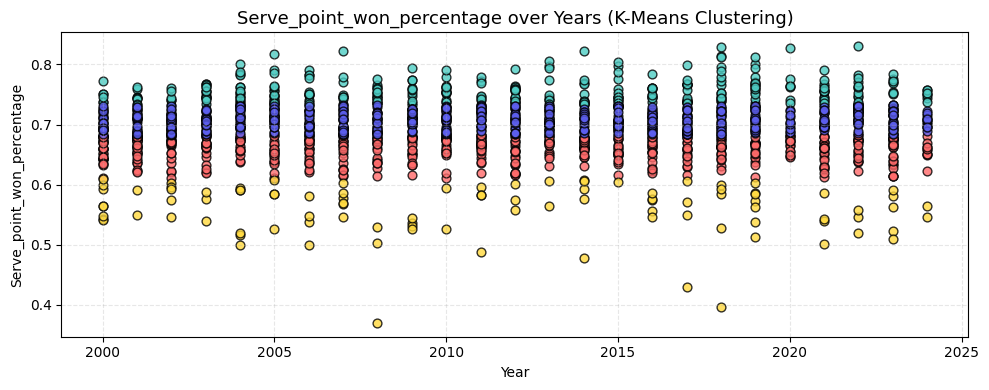

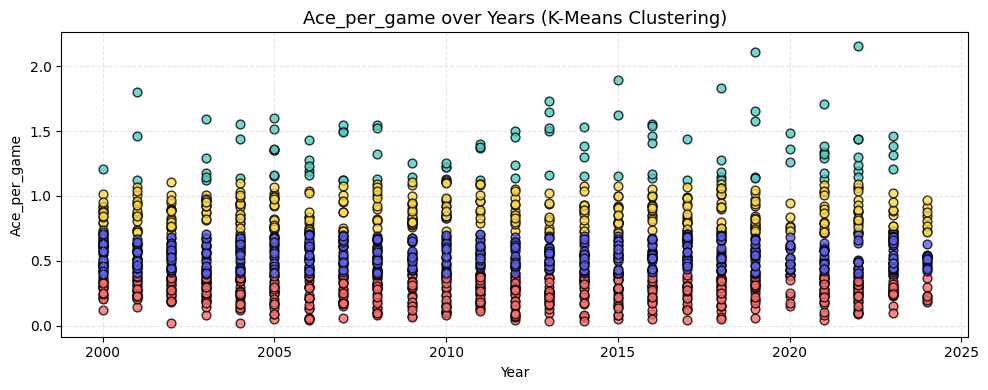

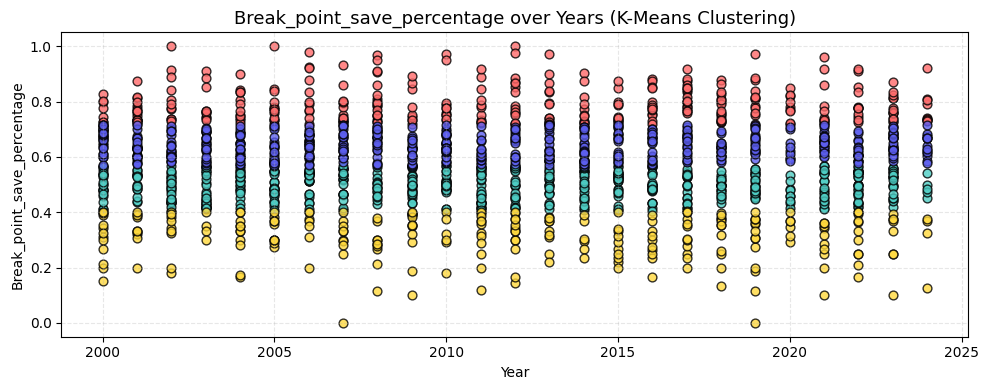

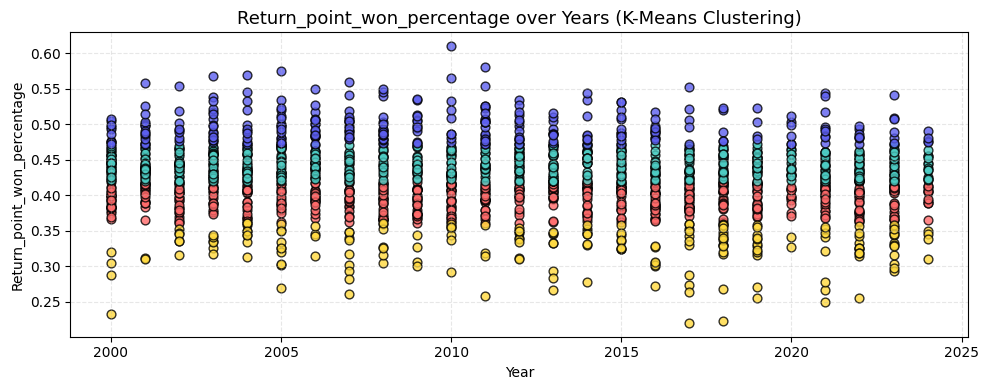

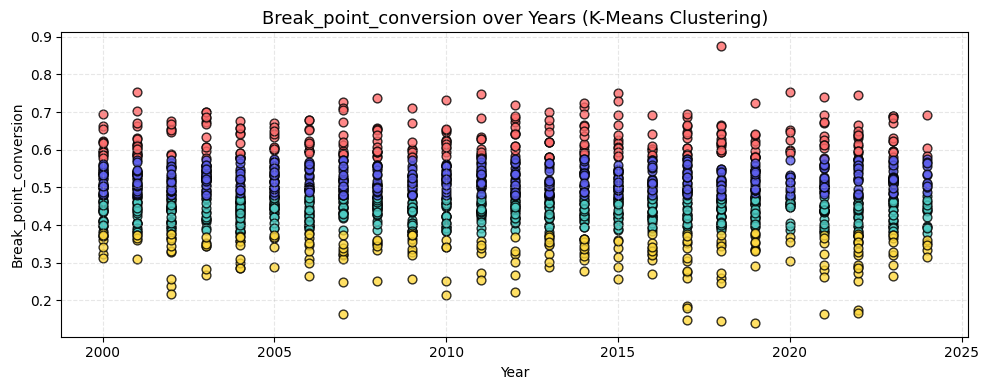

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# -------------------------
# CONFIG
# -------------------------
CSV_PATH = "updatedData.csv"
YEAR_COL = "Year"
METRICS = [
    "Serve_point_won_percentage",
    "Ace_per_game",
    "Break_point_save_percentage",
    "Return_point_won_percentage",
    "Break_point_conversion",
]
N_CLUSTERS = 4
COLOR_MAP = ["#FF6B6B", "#4ECDC4", "#FFD93D", "#5D5FEF"]  # 4 pleasant, distinct colors
# -------------------------

# 1. Load data
df = pd.read_csv(CSV_PATH)

# 2. Loop through metrics
for metric in METRICS:
    df_metric = df[[YEAR_COL, metric]].dropna()
    X = df_metric[[metric]].values
    years = df_metric[YEAR_COL].values

    # Scale and cluster
    X_scaled = StandardScaler().fit_transform(X)
    kmeans = KMeans(n_clusters=N_CLUSTERS, n_init="auto", random_state=42)
    clusters = kmeans.fit_predict(X_scaled)

    # Plot
    plt.figure(figsize=(10, 4))
    for cluster_id in range(N_CLUSTERS):
        mask = clusters == cluster_id
        plt.scatter(
            years[mask],
            X[mask],
            color=COLOR_MAP[cluster_id],
            edgecolor="k",
            s=40,
            alpha=0.8
        )

    plt.title(f"{metric} over Years (K-Means Clustering)", fontsize=13)
    plt.xlabel("Year")
    plt.ylabel(metric)
    plt.grid(True, linestyle="--", alpha=0.3)
    plt.tight_layout()
    plt.show()


In the graphs above, I created 4 clusters for each metric across years. I observed that almost every year contains a similar number of data points in each cluster. For example, the number of points in cluster 3 remains fairly consistent year to year. This suggests that using linear regression would likely result in a straight line, and even with other methods, the trend would remain mostly linear—except for some years where noise may introduce slight deviations.

I think straight line is not an incredible prediction for these metrics because some years can be different, so I will try different Machine Learning methods and tried to find a line which can also anticipate noises of the data.

This code is for linear regression for each 5 metrics throguh years.

Serve_point_won_percentage - MSE: 0.0029, RMSE: 0.0537
Ace_per_game - MSE: 0.1079, RMSE: 0.3285
Break_point_save_percentage - MSE: 0.0261, RMSE: 0.1616
Return_point_won_percentage - MSE: 0.0032, RMSE: 0.0567
Break_point_conversion - MSE: 0.0091, RMSE: 0.0956


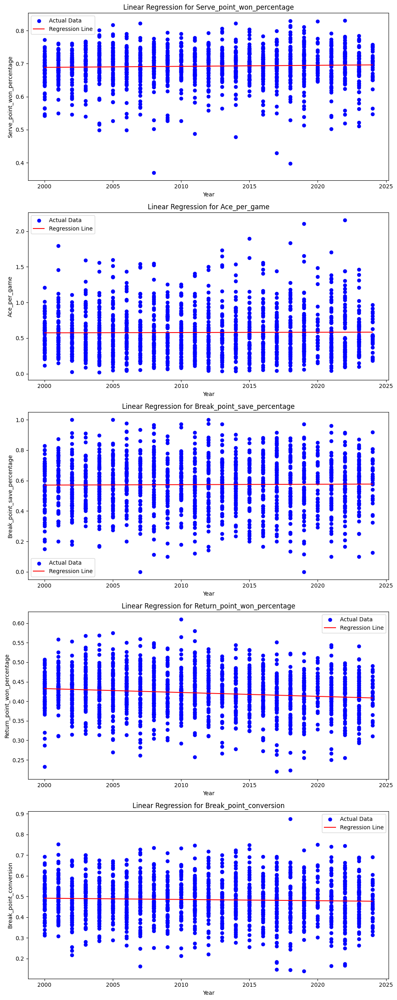

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np

# Load the data
data = pd.read_csv('updatedData.csv')

# Define the features (X) - years
X = data[['Year']]  # Assuming 'Year' is the column name for years

# Define the target variables (metrics)
metrics = ['Serve_point_won_percentage', 'Ace_per_game', 'Break_point_save_percentage',
           'Return_point_won_percentage', 'Break_point_conversion']

# Create a figure and axes for the plots
fig, axes = plt.subplots(len(metrics), 1, figsize=(10, 5 * len(metrics)))  # Adjust figsize as needed

# Loop through each metric and create a linear regression model and plot
for i, metric in enumerate(metrics):
    y = data[[metric]]  # Target variable for the current metric

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create and train the linear regression model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Make predictions on the entire range of years
    X_range = pd.DataFrame({'Year': range(data['Year'].min(), data['Year'].max() + 1)})
    y_pred_range = model.predict(X_range)

    # Predict on test set for error calculation
    y_pred_test = model.predict(X_test)

    # Calculate Mean Squared Error and Root Mean Squared Error
    mse = mean_squared_error(y_test, y_pred_test)
    rmse = np.sqrt(mse)
    print(f'{metric} - MSE: {mse:.4f}, RMSE: {rmse:.4f}')

    # Plot the data and the regression line
    ax = axes[i]  # Get the current axis
    ax.scatter(X, y, color='blue', label='Actual Data')  # Scatter plot of actual data
    ax.plot(X_range['Year'], y_pred_range, color='red', label='Regression Line')  # Line plot of predictions

    ax.set_title(f'Linear Regression for {metric}')
    ax.set_xlabel('Year')
    ax.set_ylabel(metric)
    ax.legend()

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


This code is for linear regression for each tournament level.

[A] Serve_point_won_percentage - R²: 0.001, MSE: 0.0025, RMSE: 0.0502
[A] Ace_per_game - R²: -0.004, MSE: 0.1151, RMSE: 0.3393
[A] Break_point_save_percentage - R²: -0.001, MSE: 0.0229, RMSE: 0.1513
[A] Return_point_won_percentage - R²: 0.014, MSE: 0.0030, RMSE: 0.0549
[A] Break_point_conversion - R²: 0.000, MSE: 0.0115, RMSE: 0.1073


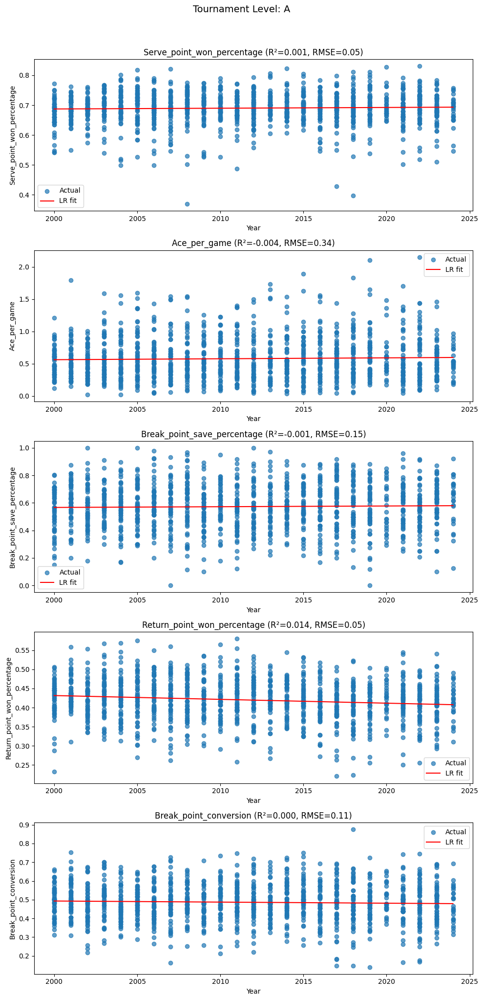

[M] Serve_point_won_percentage - R²: -0.075, MSE: 0.0037, RMSE: 0.0611
[M] Ace_per_game - R²: -0.016, MSE: 0.0849, RMSE: 0.2914
[M] Break_point_save_percentage - R²: -0.072, MSE: 0.0175, RMSE: 0.1323
[M] Return_point_won_percentage - R²: 0.075, MSE: 0.0032, RMSE: 0.0568
[M] Break_point_conversion - R²: -0.053, MSE: 0.0053, RMSE: 0.0727


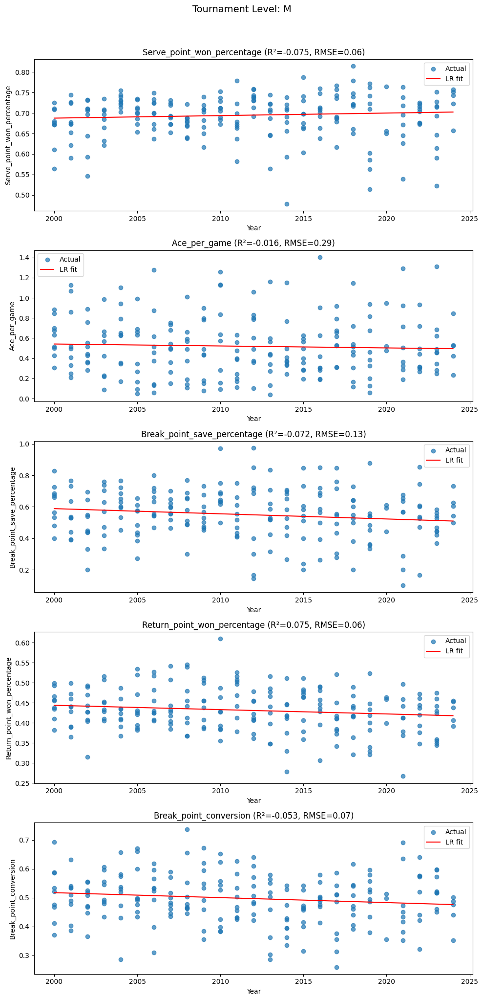

[G] Serve_point_won_percentage - R²: 0.004, MSE: 0.0009, RMSE: 0.0302
[G] Ace_per_game - R²: 0.049, MSE: 0.0256, RMSE: 0.1599
[G] Break_point_save_percentage - R²: -0.013, MSE: 0.0102, RMSE: 0.1012
[G] Return_point_won_percentage - R²: 0.000, MSE: 0.0012, RMSE: 0.0340
[G] Break_point_conversion - R²: 0.047, MSE: 0.0031, RMSE: 0.0557


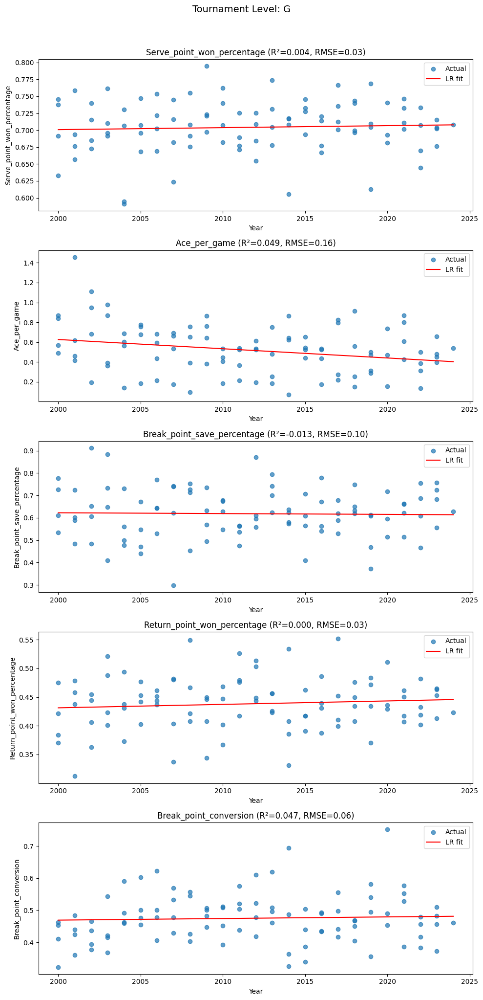

[F] Serve_point_won_percentage - R²: -1.592, MSE: 0.0010, RMSE: 0.0313
[F] Ace_per_game - R²: -0.605, MSE: 0.0516, RMSE: 0.2273
[F] Break_point_save_percentage - R²: -0.178, MSE: 0.0535, RMSE: 0.2313
[F] Return_point_won_percentage - R²: -6.066, MSE: 0.0020, RMSE: 0.0449
[F] Break_point_conversion - R²: -0.377, MSE: 0.0035, RMSE: 0.0595


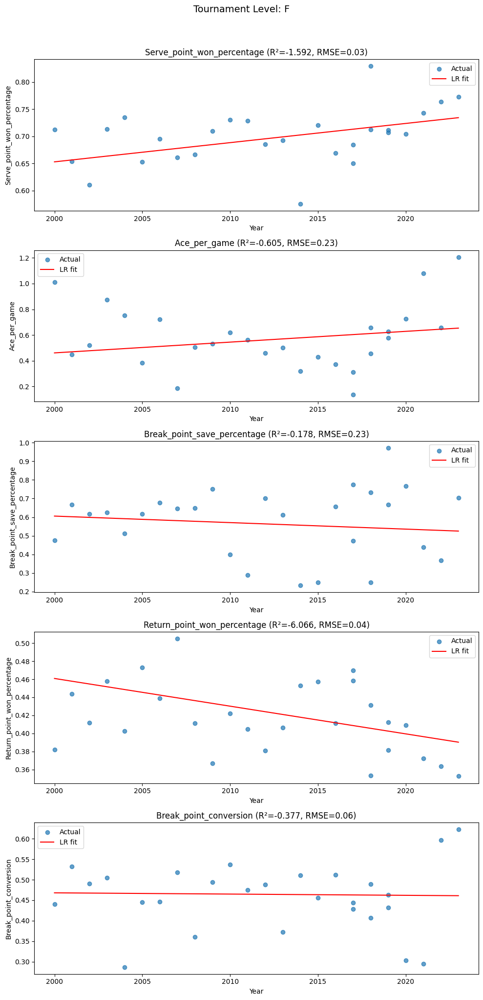

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np

CSV_PATH    = "updatedData.csv"
YEAR_COL    = "Year"
LEVEL_COL   = "tourney_level"
LEVELS      = ["A", "M", "G", "F"]
METRICS     = [
    "Serve_point_won_percentage",
    "Ace_per_game",
    "Break_point_save_percentage",
    "Return_point_won_percentage",
    "Break_point_conversion",
]

def plot_for_level(df: pd.DataFrame, level: str):
    subset = df[df[LEVEL_COL] == level]
    if subset.empty:
        print(f"[warn] No data for tourney_level = {level}")
        return

    fig, axes = plt.subplots(len(METRICS), 1, figsize=(10, 4 * len(METRICS)))
    fig.suptitle(f"Tournament Level: {level}", fontsize=14, y=1.02)

    for i, metric in enumerate(METRICS):
        X = subset[[YEAR_COL]]
        y = subset[[metric]]

        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        model = LinearRegression()
        model.fit(X_train, y_train)
        r2 = model.score(X_test, y_test)

        # Predict on test set for error calculation
        y_test_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_test_pred)
        rmse = np.sqrt(mse)

        print(f"[{level}] {metric} - R²: {r2:.3f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}")

        # Predict on full year range for plotting
        X_range = pd.DataFrame({
            YEAR_COL: range(subset[YEAR_COL].min(), subset[YEAR_COL].max() + 1)
        })
        y_pred = model.predict(X_range)

        ax = axes[i]
        ax.scatter(X, y, label="Actual", alpha=0.7)
        ax.plot(X_range[YEAR_COL], y_pred, color="red", label="LR fit")
        ax.set_xlabel("Year")
        ax.set_ylabel(metric)
        ax.set_title(f"{metric} (R²={r2:.3f}, RMSE={rmse:.2f})")
        ax.legend()

    plt.tight_layout()
    plt.show()

# MAIN: run for each level
df = pd.read_csv(CSV_PATH)
for level in LEVELS:
    plot_for_level(df, level)


This code is for each surface.

[Clay] Serve_point_won_percentage - R²: -0.037, MSE: 0.0020, RMSE: 0.0450
[Clay] Ace_per_game - R²: -0.003, MSE: 0.0514, RMSE: 0.2266
[Clay] Break_point_save_percentage - R²: -0.004, MSE: 0.0220, RMSE: 0.1485
[Clay] Return_point_won_percentage - R²: 0.031, MSE: 0.0022, RMSE: 0.0472
[Clay] Break_point_conversion - R²: 0.001, MSE: 0.0079, RMSE: 0.0891


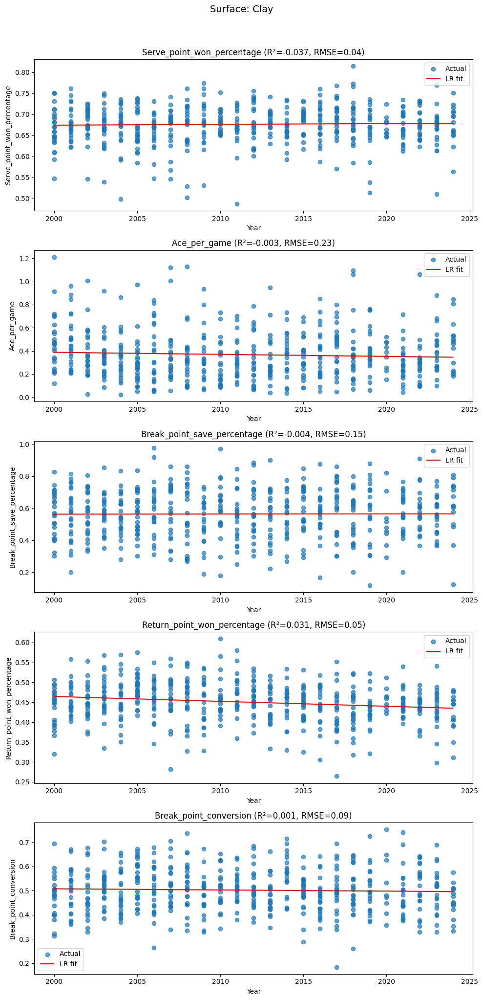

[Hard] Serve_point_won_percentage - R²: -0.001, MSE: 0.0039, RMSE: 0.0621
[Hard] Ace_per_game - R²: -0.015, MSE: 0.1275, RMSE: 0.3571
[Hard] Break_point_save_percentage - R²: -0.008, MSE: 0.0299, RMSE: 0.1729
[Hard] Return_point_won_percentage - R²: 0.016, MSE: 0.0031, RMSE: 0.0560
[Hard] Break_point_conversion - R²: 0.001, MSE: 0.0118, RMSE: 0.1087


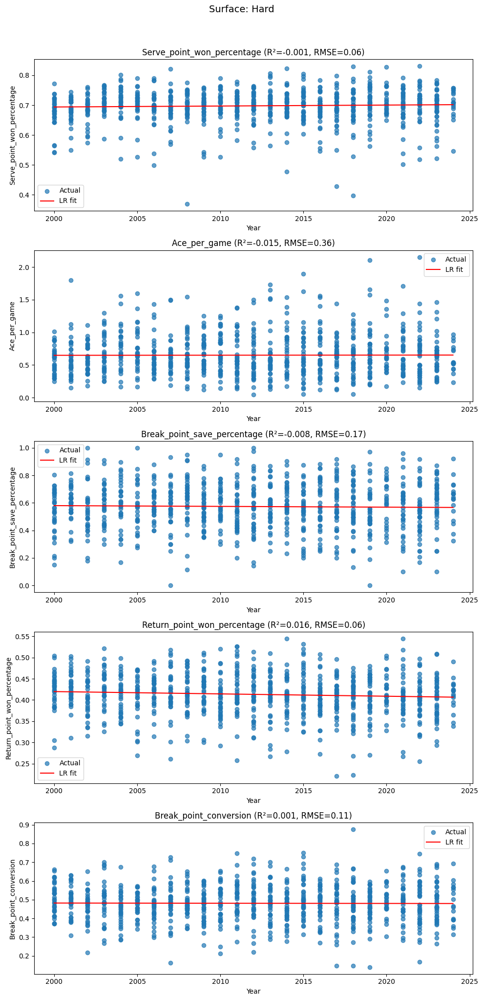

[Carpet] Serve_point_won_percentage - R²: -2.293, MSE: 0.0009, RMSE: 0.0296
[Carpet] Ace_per_game - R²: -0.115, MSE: 0.0212, RMSE: 0.1455
[Carpet] Break_point_save_percentage - R²: -0.174, MSE: 0.0227, RMSE: 0.1507
[Carpet] Return_point_won_percentage - R²: -0.104, MSE: 0.0026, RMSE: 0.0506
[Carpet] Break_point_conversion - R²: -0.036, MSE: 0.0197, RMSE: 0.1402


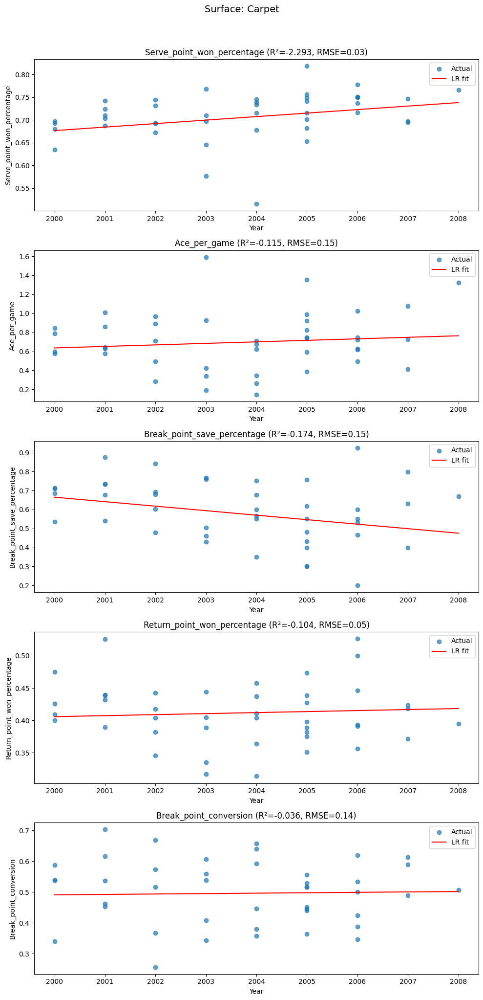

[Grass] Serve_point_won_percentage - R²: -0.011, MSE: 0.0019, RMSE: 0.0433
[Grass] Ace_per_game - R²: -0.057, MSE: 0.0969, RMSE: 0.3112
[Grass] Break_point_save_percentage - R²: 0.002, MSE: 0.0241, RMSE: 0.1553
[Grass] Return_point_won_percentage - R²: -0.027, MSE: 0.0022, RMSE: 0.0469
[Grass] Break_point_conversion - R²: -0.018, MSE: 0.0135, RMSE: 0.1163


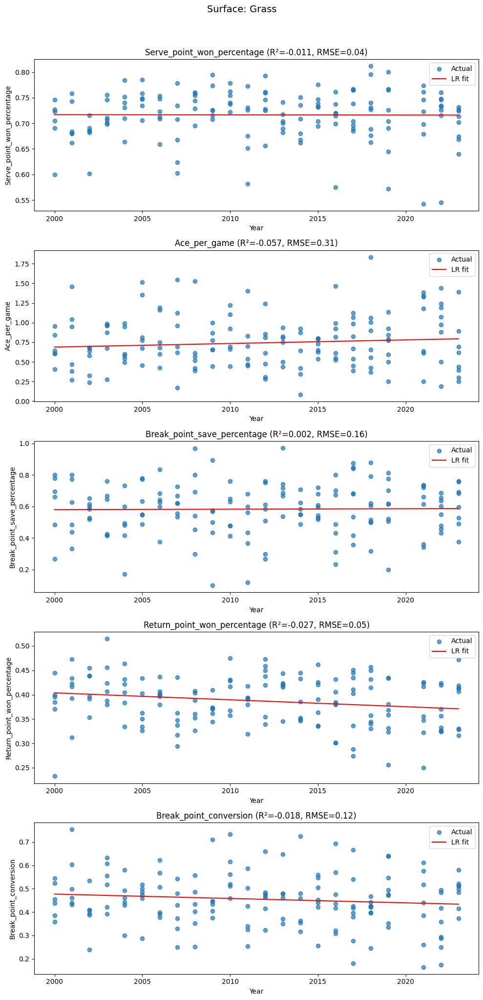

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np

CSV_PATH     = "updatedData.csv"
YEAR_COL     = "Year"
SURFACE_COL  = "surface"
SURFACES     = ["Clay", "Hard", "Carpet", "Grass"]
METRICS      = [
    "Serve_point_won_percentage",
    "Ace_per_game",
    "Break_point_save_percentage",
    "Return_point_won_percentage",
    "Break_point_conversion",
]

def plot_for_surface(df: pd.DataFrame, surface: str):
    subset = df[df[SURFACE_COL] == surface]
    if subset.empty:
        print(f"[warn] No data for surface = {surface}")
        return

    fig, axes = plt.subplots(len(METRICS), 1, figsize=(10, 4 * len(METRICS)))
    fig.suptitle(f"Surface: {surface}", fontsize=14, y=1.02)

    for i, metric in enumerate(METRICS):
        X = subset[[YEAR_COL]]
        y = subset[[metric]]

        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        model = LinearRegression()
        model.fit(X_train, y_train)
        r2 = model.score(X_test, y_test)

        # Predict on test set for error metrics
        y_test_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_test_pred)
        rmse = np.sqrt(mse)

        print(f"[{surface}] {metric} - R²: {r2:.3f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}")

        # Predict on full year range for plotting
        X_range = pd.DataFrame({
            YEAR_COL: range(subset[YEAR_COL].min(), subset[YEAR_COL].max() + 1)
        })
        y_pred = model.predict(X_range)

        ax = axes[i]
        ax.scatter(X, y, label="Actual", alpha=0.7)
        ax.plot(X_range[YEAR_COL], y_pred, color="red", label="LR fit")
        ax.set_xlabel("Year")
        ax.set_ylabel(metric)
        ax.set_title(f"{metric} (R²={r2:.3f}, RMSE={rmse:.2f})")
        ax.legend()

    plt.tight_layout()
    plt.show()

# MAIN: run for each surface
df = pd.read_csv(CSV_PATH)
for surface in SURFACES:
    plot_for_surface(df, surface)


The lines are showing mean does not change a lot and that is compatible with my results from hypothesis testing, but there is lots of dots (data) which are outliers, so I will try another methods too. Firstly, I will try Decision tree with xGBoost because it is complex model and it can act different than Linear Regression.

This is decision tree method with XGBoost algorithm for each metrics through years. It will find best max depht for lowest error rate and use it.


XGBoost cross-validated scores (5-fold TimeSeriesSplit) with per-metric best max_depth:
                     Metric  Best_depth    MAE    MSE   RMSE     R²
 Serve_point_won_percentage           8  0.018  0.018  0.018  0.018
               Ace_per_game           3  0.174  0.174  0.174  0.174
Break_point_save_percentage           6  0.068  0.068  0.068  0.068
Return_point_won_percentage           5 -0.002 -0.002 -0.002 -0.002
     Break_point_conversion           3  0.032  0.032  0.032  0.032


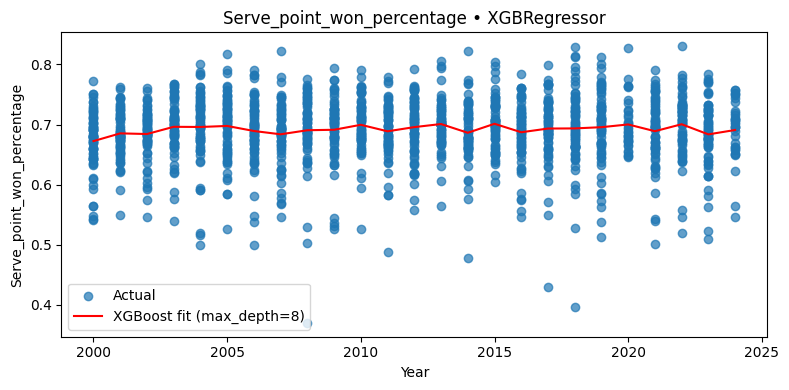

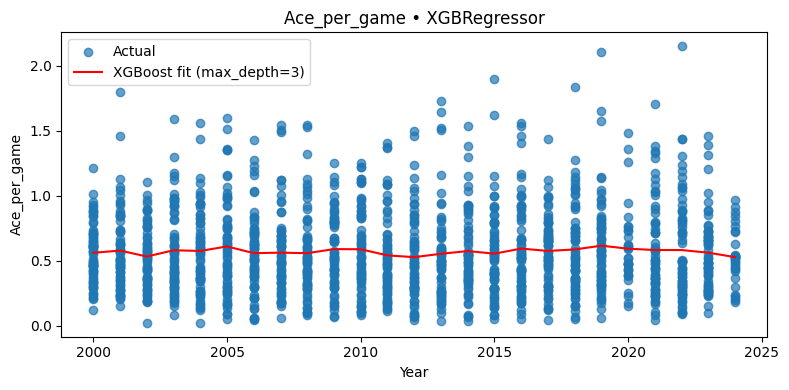

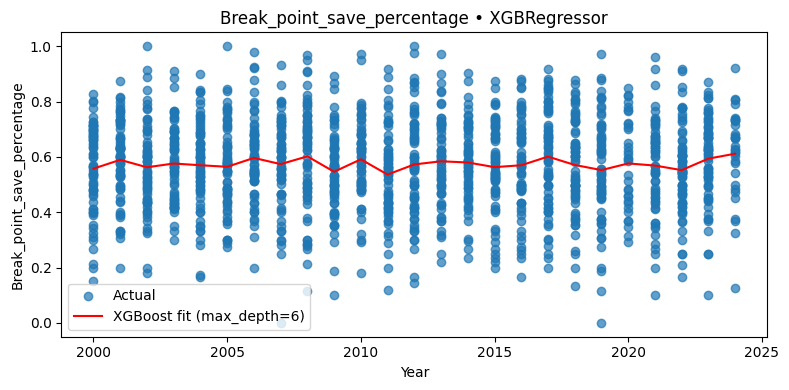

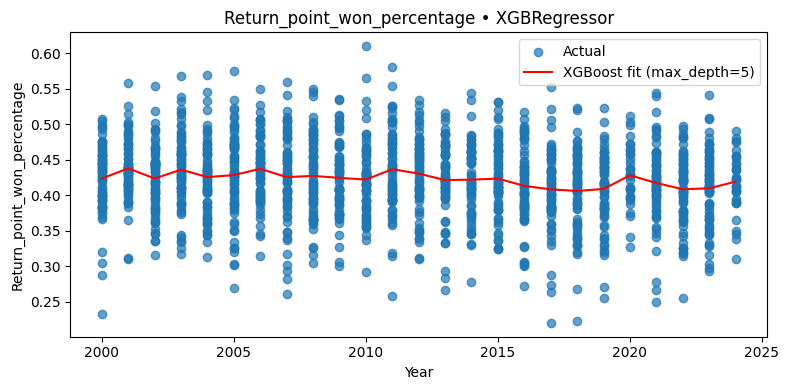

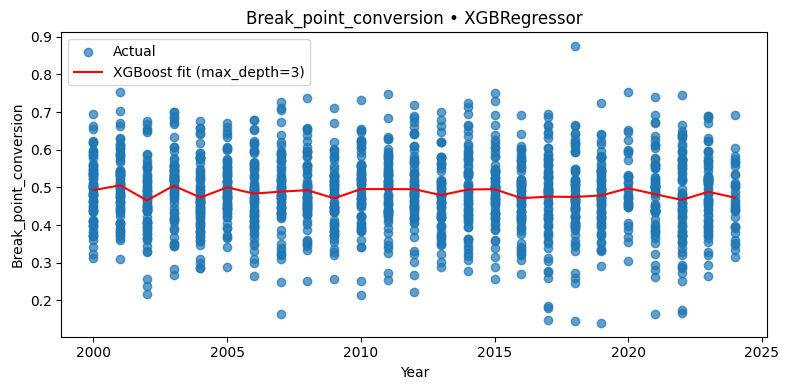

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
import numpy as np

# ---------------- CONFIG ----------------
CSV_PATH   = "updatedData.csv"
YEAR_COL   = "Year"
METRICS    = [
    "Serve_point_won_percentage",
    "Ace_per_game",
    "Break_point_save_percentage",
    "Return_point_won_percentage",
    "Break_point_conversion",
]
BASE_XGB_PARAMS = dict(
    objective="reg:squarederror",
    n_estimators=400,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
)
DEPTH_RANGE = range(2, 13)     # max_depth grid: 2‒12
N_SPLITS    = 5                # time-series CV folds
PLOT_FITS   = True             # turn off if only the table is needed
# ----------------------------------------

df   = pd.read_csv(CSV_PATH)
tscv = TimeSeriesSplit(n_splits=N_SPLITS)

results       = []   # will hold final scores
final_models  = {}   # trained on full data with best depth

for metric in METRICS:
    X = df[[YEAR_COL]]
    y = df[metric]

    # ---- 1. grid-search max_depth ----
    depth_mse = []
    for d in DEPTH_RANGE:
        fold_mse = []
        for tr, te in tscv.split(X):
            mdl = XGBRegressor(max_depth=d, **BASE_XGB_PARAMS)
            mdl.fit(X.iloc[tr], y.iloc[tr])
            preds = mdl.predict(X.iloc[te])
            fold_mse.append(mean_squared_error(y.iloc[te], preds))
        depth_mse.append(np.mean(fold_mse))

    best_depth = DEPTH_RANGE[int(np.argmin(depth_mse))]

    # ---- 2. evaluate with best_depth ----
    mae = mse = rmse = r2 = []
    for tr, te in tscv.split(X):
        mdl = XGBRegressor(max_depth=best_depth, **BASE_XGB_PARAMS)
        mdl.fit(X.iloc[tr], y.iloc[tr])
        preds = mdl.predict(X.iloc[te])

        mae.append(mean_absolute_error(y.iloc[te], preds))
        mse.append(mean_squared_error(y.iloc[te], preds))
        rmse.append(np.sqrt(mse[-1]))
        r2.append(r2_score(y.iloc[te], preds))

    results.append({
        "Metric"     : metric,
        "Best_depth" : best_depth,
        "MAE"        : np.mean(mae),
        "MSE"        : np.mean(mse),
        "RMSE"       : np.mean(rmse),
        "R²"         : np.mean(r2),
    })

    # train on full series for plotting
    final_models[metric] = XGBRegressor(max_depth=best_depth, **BASE_XGB_PARAMS).fit(X, y)

# ---- 3. summary table ----
results_df = pd.DataFrame(results).round(3)
print(f"\nXGBoost cross-validated scores ({N_SPLITS}-fold TimeSeriesSplit) "
      f"with per-metric best max_depth:")
print(results_df.to_string(index=False))

# ---- 4. optional plots ----
if PLOT_FITS:
    grid = pd.DataFrame({YEAR_COL: range(df[YEAR_COL].min(), df[YEAR_COL].max() + 1)})
    for metric, model in final_models.items():
        plt.figure(figsize=(8, 4))
        plt.scatter(df[YEAR_COL], df[metric], alpha=0.7, label="Actual")
        plt.plot(grid[YEAR_COL], model.predict(grid), "r",
                 label=f"XGBoost fit (max_depth={model.max_depth})")
        plt.title(f"{metric} • XGBRegressor")
        plt.xlabel("Year")
        plt.ylabel(metric)
        plt.legend()
        plt.tight_layout()
        plt.show()


This is code for each surface.


XGBoost cross-validated scores by surface & metric (best max_depth chosen):
Surface                      Metric  Best_depth    MAE    MSE   RMSE     R²
   Clay  Serve_point_won_percentage           2  0.004  0.004  0.004  0.004
   Clay                Ace_per_game           3  0.092  0.092  0.092  0.092
   Clay Break_point_save_percentage           4  0.069  0.069  0.069  0.069
   Clay Return_point_won_percentage           2  0.002  0.002  0.002  0.002
   Clay      Break_point_conversion           3  0.041  0.041  0.041  0.041
   Hard  Serve_point_won_percentage           4 -0.002 -0.002 -0.002 -0.002
   Hard                Ace_per_game           2  0.155  0.155  0.155  0.155
   Hard Break_point_save_percentage           3  0.074  0.074  0.074  0.074
   Hard Return_point_won_percentage           4  0.017  0.017  0.017  0.017
   Hard      Break_point_conversion          10  0.042  0.042  0.042  0.042
  Grass  Serve_point_won_percentage           3 -0.030 -0.030 -0.030 -0.030
  Grass    

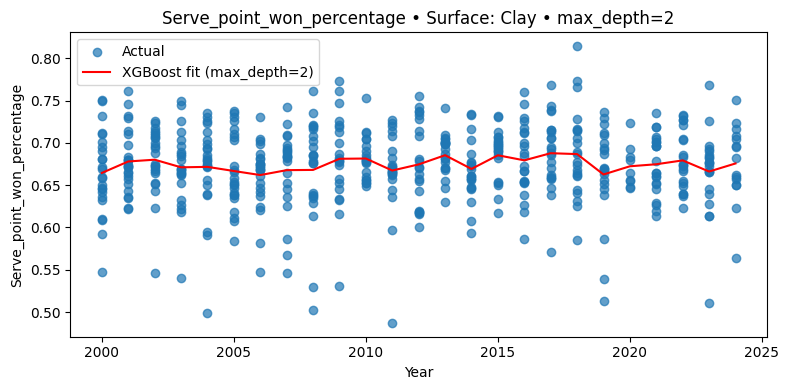

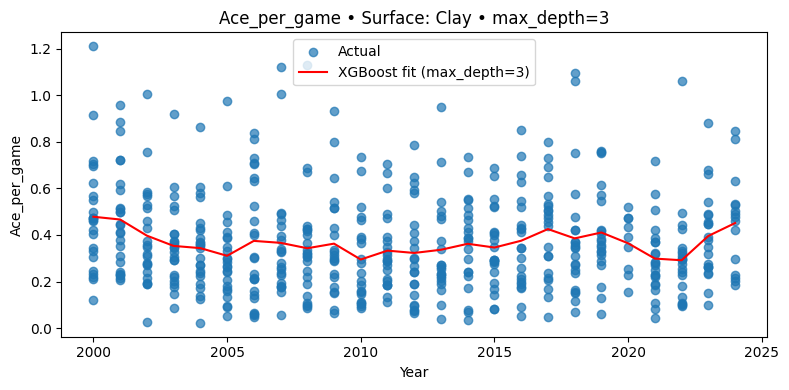

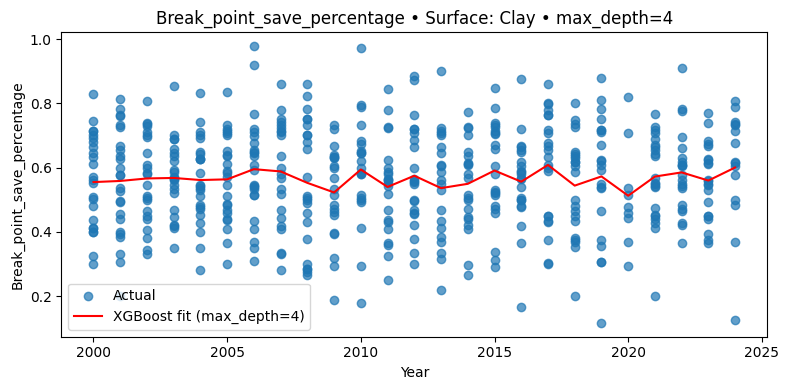

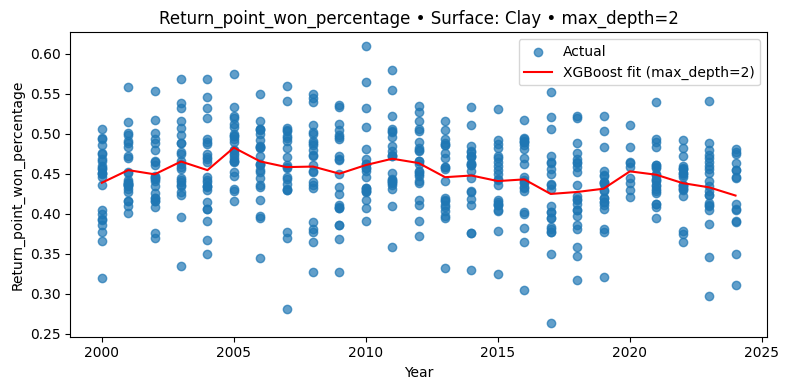

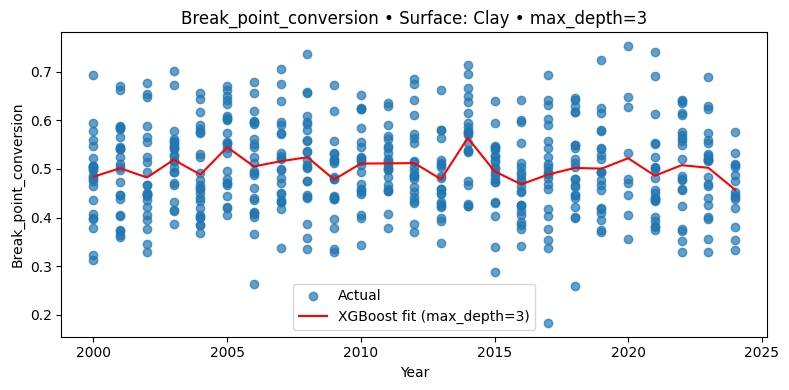

...

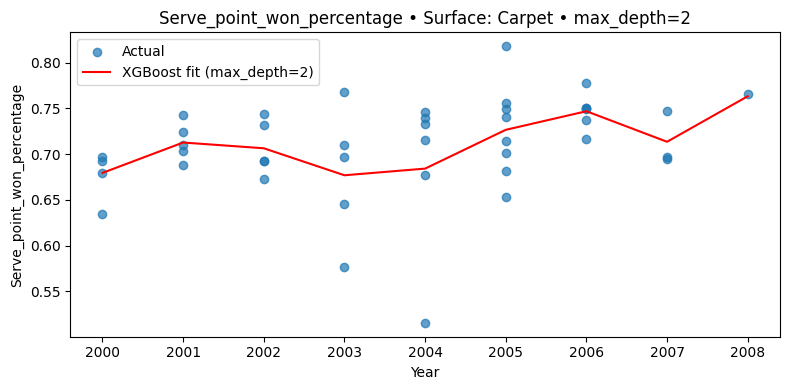

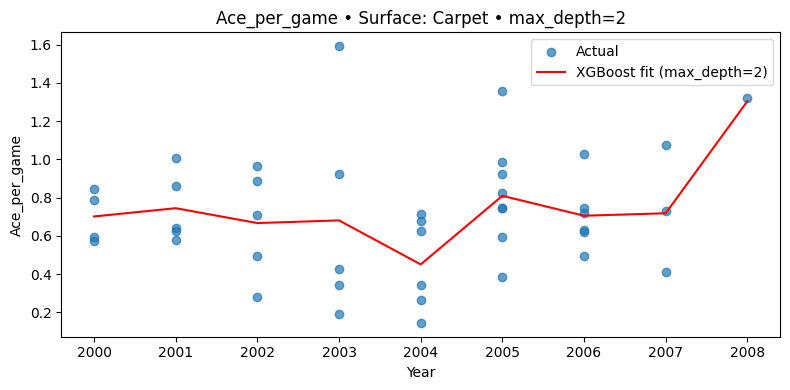

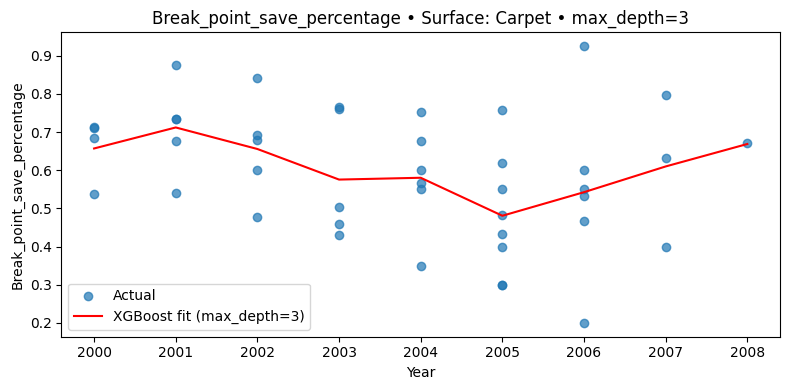

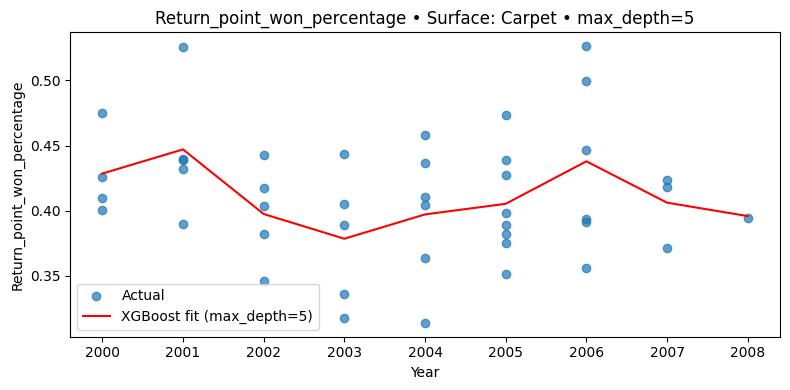

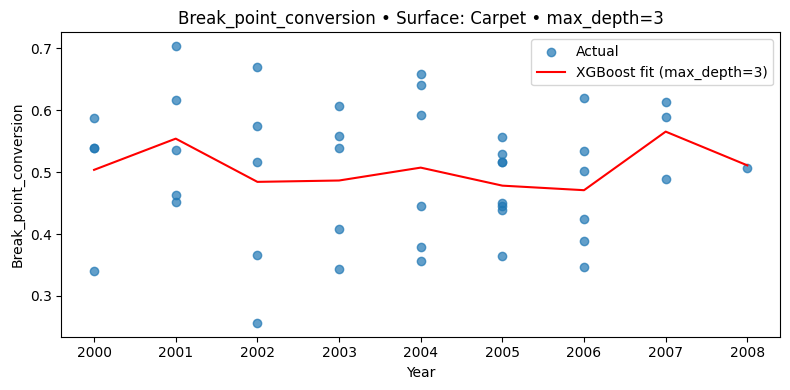

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
import numpy as np

# ------------- CONFIG -------------
CSV_PATH    = "updatedData.csv"
YEAR_COL    = "Year"
SURFACE_COL = "surface"
SURFACES    = ["Clay", "Hard", "Grass", "Carpet"]
METRICS     = [
    "Serve_point_won_percentage", "Ace_per_game",
    "Break_point_save_percentage", "Return_point_won_percentage",
    "Break_point_conversion",
]
BASE_XGB    = dict(
    objective="reg:squarederror",
    n_estimators=400,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
)
DEPTH_RANGE = range(2, 13)   # max_depth grid
N_SPLITS    = 5              # TimeSeriesSplit folds
PLOT_FITS   = True
# -----------------------------------

df   = pd.read_csv(CSV_PATH)
tscv = TimeSeriesSplit(n_splits=N_SPLITS)

results, final_models = [], {}

# ----- loop over surface & metric -----
for surf in SURFACES:
    dfs = df[df[SURFACE_COL] == surf]
    if dfs.empty:
        print(f"[!] No data for surface: {surf}")
        continue

    for metric in METRICS:
        X = dfs[[YEAR_COL]]
        y = dfs[metric]

        # --- 1. grid-search best depth ---
        depth_mse = []
        for d in DEPTH_RANGE:
            fold_mse = []
            for tr, te in tscv.split(X):
                mdl = XGBRegressor(max_depth=d, **BASE_XGB)
                mdl.fit(X.iloc[tr], y.iloc[tr])
                fold_mse.append(mean_squared_error(y.iloc[te], mdl.predict(X.iloc[te])))
            depth_mse.append(np.mean(fold_mse))

        best_depth = DEPTH_RANGE[int(np.argmin(depth_mse))]

        # --- 2. evaluate with best depth ---
        mae = mse = rmse = r2 = []
        for tr, te in tscv.split(X):
            mdl = XGBRegressor(max_depth=best_depth, **BASE_XGB)
            mdl.fit(X.iloc[tr], y.iloc[tr])
            yp = mdl.predict(X.iloc[te])

            mae.append(mean_absolute_error(y.iloc[te], yp))
            mse.append(mean_squared_error(y.iloc[te], yp))
            rmse.append(np.sqrt(mse[-1]))
            r2.append(r2_score(y.iloc[te], yp))

        results.append({
            "Surface": surf,
            "Metric" : metric,
            "Best_depth": best_depth,
            "MAE"    : np.mean(mae),
            "MSE"    : np.mean(mse),
            "RMSE"   : np.mean(rmse),
            "R²"     : np.mean(r2),
        })

        key = f"{surf}__{metric}"
        final_models[key] = (
            XGBRegressor(max_depth=best_depth, **BASE_XGB).fit(X, y),
            X, y, best_depth
        )

# ----- 3. summary -----
results_df = pd.DataFrame(results).round(3)
print("\nXGBoost cross-validated scores by surface & metric (best max_depth chosen):")
print(results_df.to_string(index=False))

# ----- 4. optional plots -----
if PLOT_FITS:
    for key, (model, X, y, d) in final_models.items():
        surf, metric = key.split("__")
        grid = pd.DataFrame({YEAR_COL: range(X[YEAR_COL].min(), X[YEAR_COL].max() + 1)})
        plt.figure(figsize=(8, 4))
        plt.scatter(X[YEAR_COL], y, alpha=0.7, label="Actual")
        plt.plot(grid[YEAR_COL], model.predict(grid), "r",
                 label=f"XGBoost fit (max_depth={d})")
        plt.title(f"{metric} • Surface: {surf} • max_depth={d}")
        plt.xlabel("Year"); plt.ylabel(metric)
        plt.legend(); plt.tight_layout(); plt.show()


This code is for each tournament level.


XGBoost cross-validated scores by tournament level & metric (best max_depth chosen):
Level                      Metric  Best_depth    MAE    MSE   RMSE     R²
    A  Serve_point_won_percentage           4  0.005  0.005  0.005  0.005
    A                Ace_per_game           4  0.172  0.172  0.172  0.172
    A Break_point_save_percentage           5  0.058  0.058  0.058  0.058
    A Return_point_won_percentage           3  0.017  0.017  0.017  0.017
    A      Break_point_conversion           4  0.030  0.030  0.030  0.030
    M  Serve_point_won_percentage           2 -0.034 -0.034 -0.034 -0.034
    M                Ace_per_game           2  0.115  0.115  0.115  0.115
    M Break_point_save_percentage           2  0.036  0.036  0.036  0.036
    M Return_point_won_percentage           5 -0.209 -0.209 -0.209 -0.209
    M      Break_point_conversion           2 -0.198 -0.198 -0.198 -0.198
    G  Serve_point_won_percentage           2 -0.025 -0.025 -0.025 -0.025
    G                Ace_p

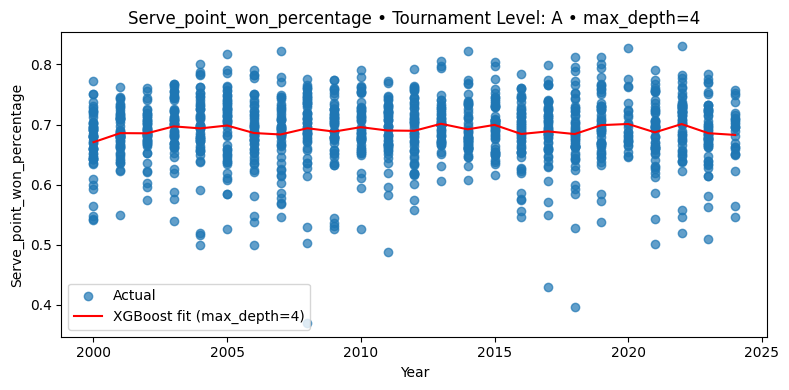

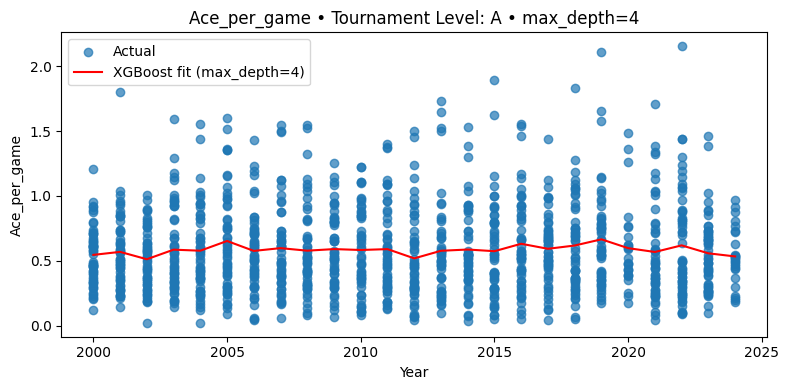

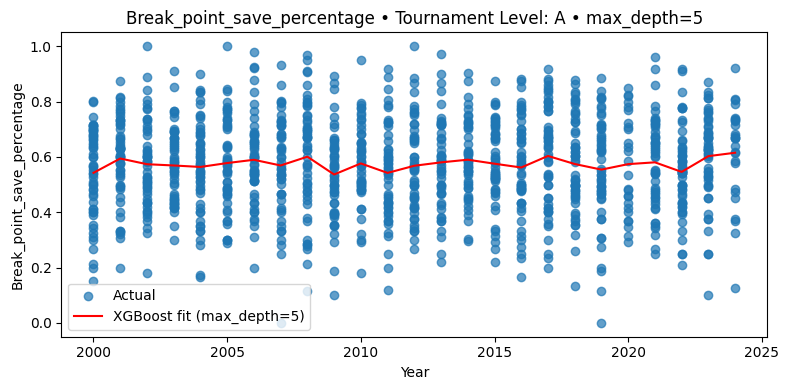

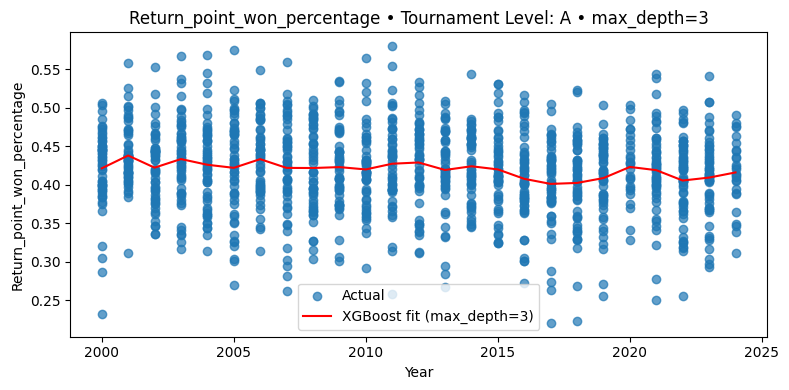

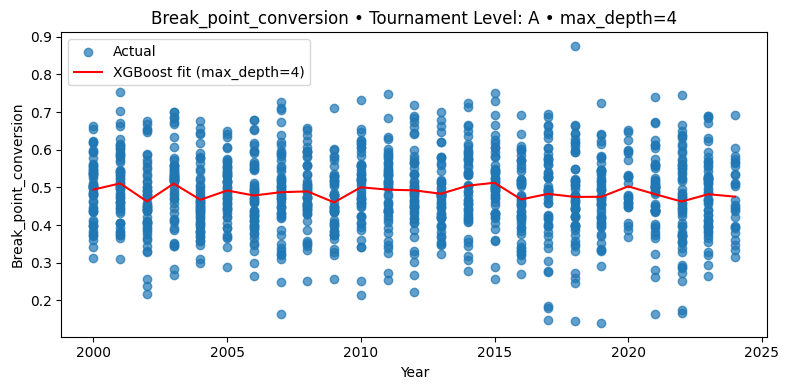

...

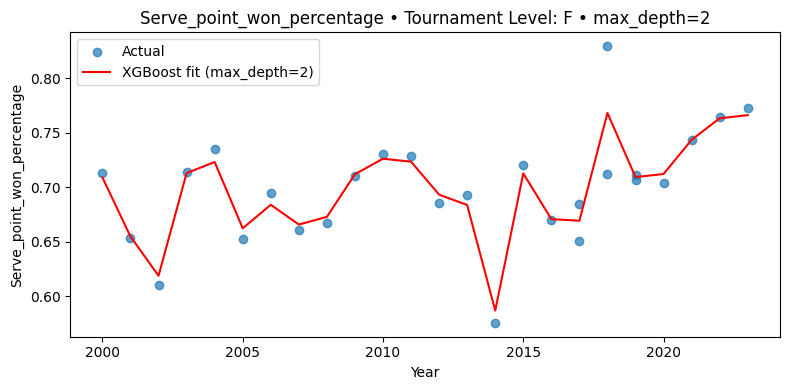

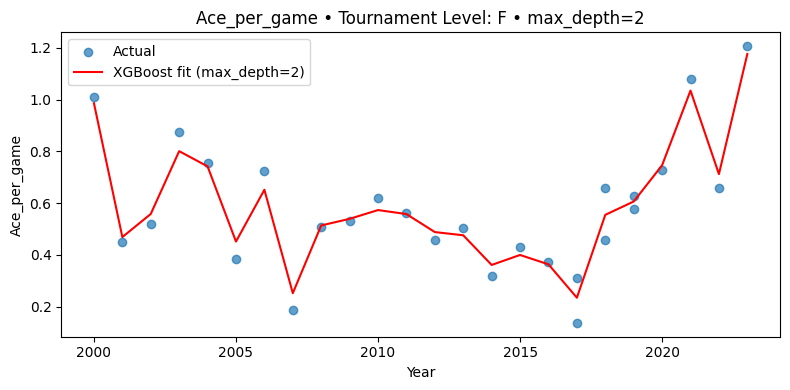

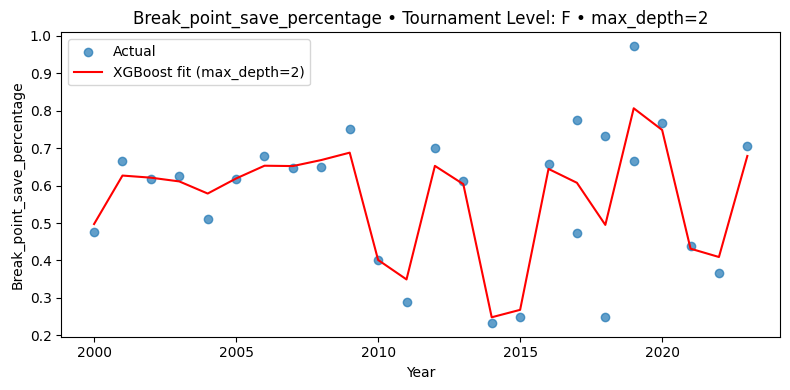

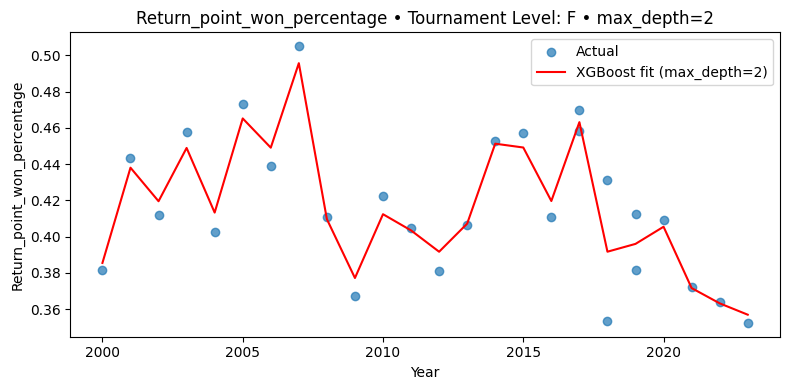

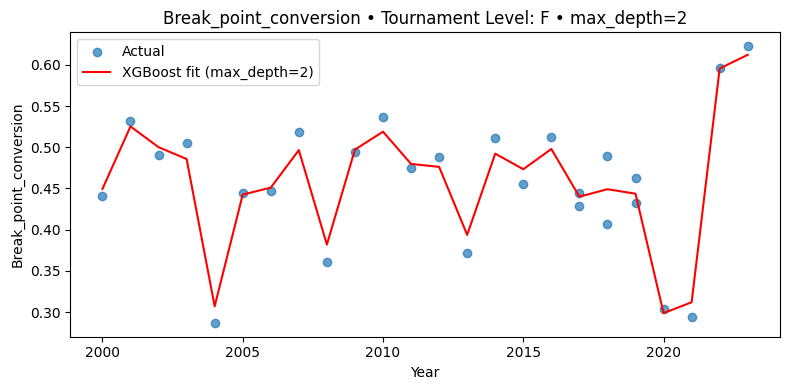

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
import numpy as np

# ------------ CONFIG ------------
CSV_PATH   = "updatedData.csv"
YEAR_COL   = "Year"
LEVEL_COL  = "tourney_level"
LEVELS     = ["A", "M", "G", "F"]
METRICS    = [
    "Serve_point_won_percentage", "Ace_per_game",
    "Break_point_save_percentage", "Return_point_won_percentage",
    "Break_point_conversion",
]
BASE_XGB   = dict(
    objective="reg:squarederror",
    n_estimators=400,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
)
DEPTH_RANGE = range(2, 13)     # try max_depth 2‒12
N_SPLITS    = 5                # TimeSeriesSplit folds
PLOT_FITS   = True
# ---------------------------------

df   = pd.read_csv(CSV_PATH)
tscv = TimeSeriesSplit(n_splits=N_SPLITS)

results, final_models = [], {}

# ---- loop over level & metric ----
for lvl in LEVELS:
    dfl = df[df[LEVEL_COL] == lvl]
    if dfl.empty:
        print(f"[!] No data for tournament level: {lvl}")
        continue

    for metric in METRICS:
        X = dfl[[YEAR_COL]]
        y = dfl[metric]

        # 1. grid-search best max_depth
        mse_per_depth = []
        for d in DEPTH_RANGE:
            fold_mse = []
            for tr, te in tscv.split(X):
                mdl = XGBRegressor(max_depth=d, **BASE_XGB)
                mdl.fit(X.iloc[tr], y.iloc[tr])
                fold_mse.append(mean_squared_error(y.iloc[te], mdl.predict(X.iloc[te])))
            mse_per_depth.append(np.mean(fold_mse))

        best_depth = DEPTH_RANGE[int(np.argmin(mse_per_depth))]

        # 2. evaluate with best_depth
        mae = mse = rmse = r2 = []
        for tr, te in tscv.split(X):
            mdl = XGBRegressor(max_depth=best_depth, **BASE_XGB)
            mdl.fit(X.iloc[tr], y.iloc[tr])
            yp = mdl.predict(X.iloc[te])

            mae.append(mean_absolute_error(y.iloc[te], yp))
            mse.append(mean_squared_error(y.iloc[te], yp))
            rmse.append(np.sqrt(mse[-1]))
            r2.append(r2_score(y.iloc[te], yp))

        results.append({
            "Level"      : lvl,
            "Metric"     : metric,
            "Best_depth" : best_depth,
            "MAE"        : np.mean(mae),
            "MSE"        : np.mean(mse),
            "RMSE"       : np.mean(rmse),
            "R²"         : np.mean(r2),
        })

        key = f"{lvl}__{metric}"
        final_models[key] = (
            XGBRegressor(max_depth=best_depth, **BASE_XGB).fit(X, y),
            X, y, best_depth
        )

# ---- show summary table ----
results_df = pd.DataFrame(results).round(3)
print("\nXGBoost cross-validated scores by tournament level & metric (best max_depth chosen):")
print(results_df.to_string(index=False))

# ---- optional plots ----
if PLOT_FITS:
    for key, (model, X, y, d) in final_models.items():
        lvl, metric = key.split("__")
        grid = pd.DataFrame({YEAR_COL: range(X[YEAR_COL].min(), X[YEAR_COL].max() + 1)})
        plt.figure(figsize=(8, 4))
        plt.scatter(X[YEAR_COL], y, alpha=0.7, label="Actual")
        plt.plot(grid[YEAR_COL], model.predict(grid), "r",
                 label=f"XGBoost fit (max_depth={d})")
        plt.title(f"{metric} • Tournament Level: {lvl} • max_depth={d}")
        plt.xlabel("Year"); plt.ylabel(metric)
        plt.legend(); plt.tight_layout(); plt.show()


Decision tree could not beat Linear Regression in terms of MSE, so I will try another more complex method than Linear Regression which is KNN regression method it is less complex than Decision tree with xGBoost, but more complex than Linear Regression, so I think it could outperform these methods.

This code is for 5 metrics with all data. It decides best k value for each metrics than use it.


Cross-validated KNN scores (5-fold TimeSeriesSplit):
                     Metric  Best_k   MAE   MSE  RMSE    R²
 Serve_point_won_percentage      12 0.003 0.003 0.003 0.003
               Ace_per_game      12 0.170 0.170 0.170 0.170
Break_point_save_percentage      10 0.072 0.072 0.072 0.072
Return_point_won_percentage      12 0.011 0.011 0.011 0.011
     Break_point_conversion      12 0.035 0.035 0.035 0.035


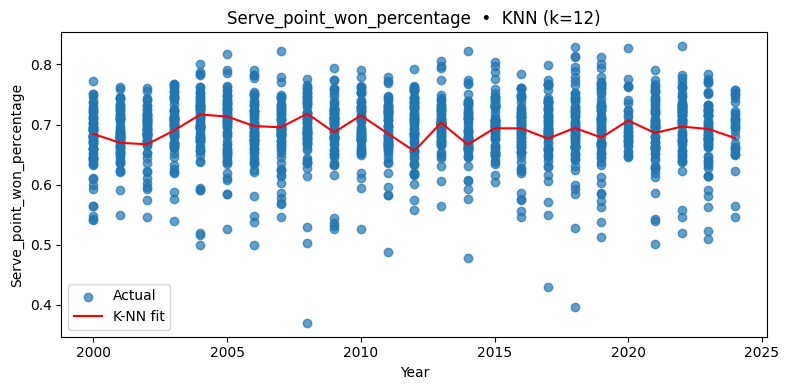

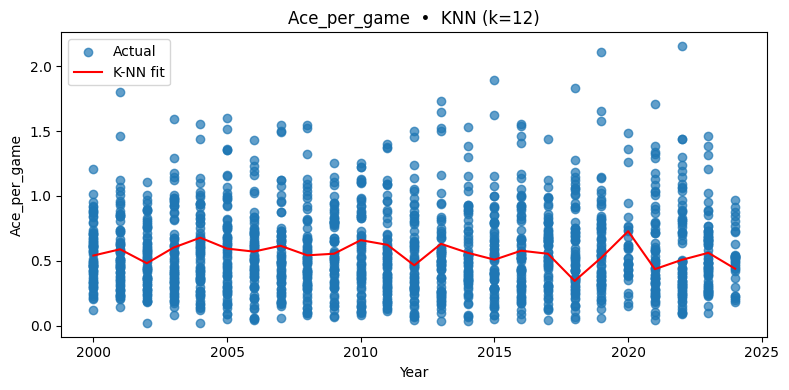

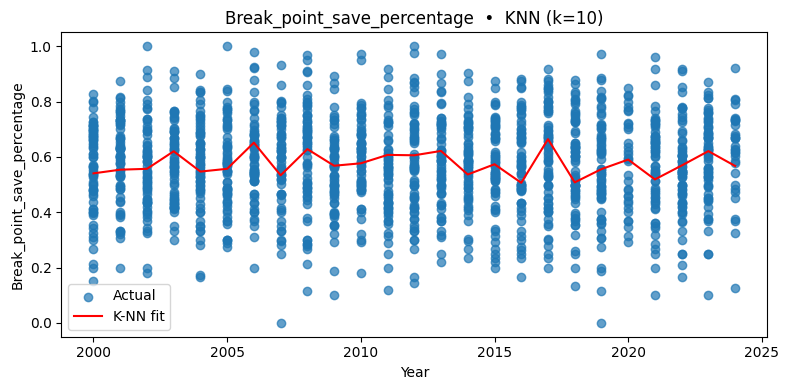

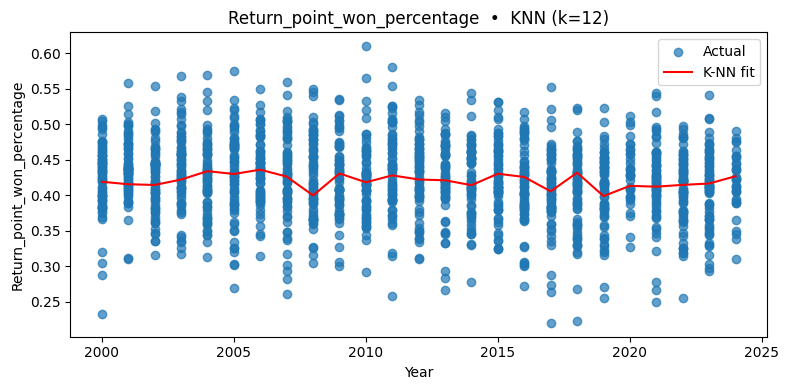

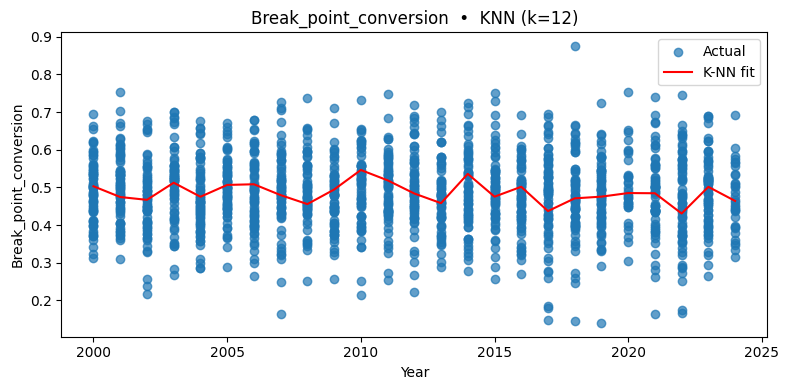

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor
import numpy as np

# ---------- CONFIG ----------
CSV_PATH   = "updatedData.csv"
YEAR_COL   = "Year"
METRICS    = [
    "Serve_point_won_percentage",
    "Ace_per_game",
    "Break_point_save_percentage",
    "Return_point_won_percentage",
    "Break_point_conversion",
]
N_SPLITS   = 5
PLOT_FITS  = True
# ----------------------------

df   = pd.read_csv(CSV_PATH)
tscv = TimeSeriesSplit(n_splits=N_SPLITS)

results = []
final_models = {}

# ----- 1. Find best k for each metric (between 1 and 12) -----
best_k_values = {}

for metric in METRICS:
    X = df[[YEAR_COL]]
    y = df[metric].values

    k_values = list(range(1, 13))
    mse_scores = []

    for k in k_values:
        fold_mse = []
        for train_idx, test_idx in tscv.split(X):
            X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]

            mdl = KNeighborsRegressor(n_neighbors=k, weights="distance", p=2)
            mdl.fit(X_train, y_train)
            y_pred = mdl.predict(X_test)

            fold_mse.append(mean_squared_error(y_test, y_pred))

        mse_scores.append(np.mean(fold_mse))

    best_k = k_values[np.argmin(mse_scores)]
    best_k_values[metric] = best_k

# ----- 2. Fit models using best k and evaluate -----
for metric in METRICS:
    X = df[[YEAR_COL]]
    y = df[metric].values

    mae = mse = rmse = r2 = []

    KNN_PARAMS = dict(n_neighbors=best_k_values[metric], weights="distance", p=2)

    for train_idx, test_idx in tscv.split(X):
        X_train = X.iloc[train_idx]
        X_test  = X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        mdl = KNeighborsRegressor(**KNN_PARAMS).fit(X_train, y_train)
        y_pred = mdl.predict(X_test)

        mae.append(mean_absolute_error(y_test, y_pred))
        mse.append(mean_squared_error(y_test, y_pred))
        rmse.append(np.sqrt(mse[-1]))
        r2.append(r2_score(y_test, y_pred))

    results.append({
        "Metric": metric,
        "Best_k": best_k_values[metric],
        "MAE"   : np.mean(mae),
        "MSE"   : np.mean(mse),
        "RMSE"  : np.mean(rmse),
        "R²"    : np.mean(r2)
    })

    final_models[metric] = (KNeighborsRegressor(**KNN_PARAMS).fit(X, y), X, y)

# ----- 3. Show all results -----
results_df = pd.DataFrame(results).round(3)
print("\nCross-validated KNN scores ({}-fold TimeSeriesSplit):".format(N_SPLITS))
print(results_df.to_string(index=False))

# ----- 4. Optional plots -----
if PLOT_FITS:
    for metric, (mdl, X, y) in final_models.items():
        years_grid = pd.DataFrame({YEAR_COL: range(X[YEAR_COL].min(), X[YEAR_COL].max() + 1)})
        y_grid_pred = mdl.predict(years_grid)

        plt.figure(figsize=(8, 4))
        plt.scatter(X[YEAR_COL], y, alpha=0.7, label="Actual")
        plt.plot(years_grid[YEAR_COL], y_grid_pred, "r", label="K-NN fit")
        plt.title(f"{metric}  •  KNN (k={best_k_values[metric]})")
        plt.xlabel("Year"); plt.ylabel(metric)
        plt.legend(); plt.tight_layout(); plt.show()


This code is for surface.


Cross-validated KNN scores by surface & metric (best k chosen):
Surface                      Metric  Best_k    MAE    MSE   RMSE     R²
   Clay  Serve_point_won_percentage      12 -0.011 -0.011 -0.011 -0.011
   Clay                Ace_per_game       5  0.095  0.095  0.095  0.095
   Clay Break_point_save_percentage      10  0.066  0.066  0.066  0.066
   Clay Return_point_won_percentage      11 -0.006 -0.006 -0.006 -0.006
   Clay      Break_point_conversion      11  0.037  0.037  0.037  0.037
   Hard  Serve_point_won_percentage       4 -0.016 -0.016 -0.016 -0.016
   Hard                Ace_per_game       9  0.158  0.158  0.158  0.158
   Hard Break_point_save_percentage      12  0.079  0.079  0.079  0.079
   Hard Return_point_won_percentage       8  0.000  0.000  0.000  0.000
   Hard      Break_point_conversion       6  0.036  0.036  0.036  0.036
  Grass  Serve_point_won_percentage      10  0.006  0.006  0.006  0.006
  Grass                Ace_per_game      10  0.164  0.164  0.164  0.164

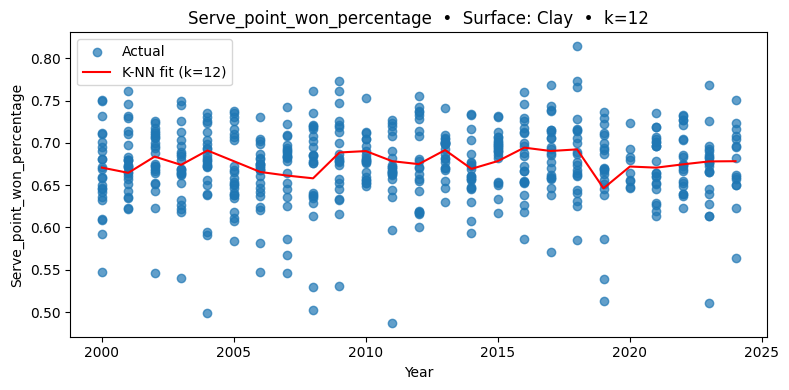

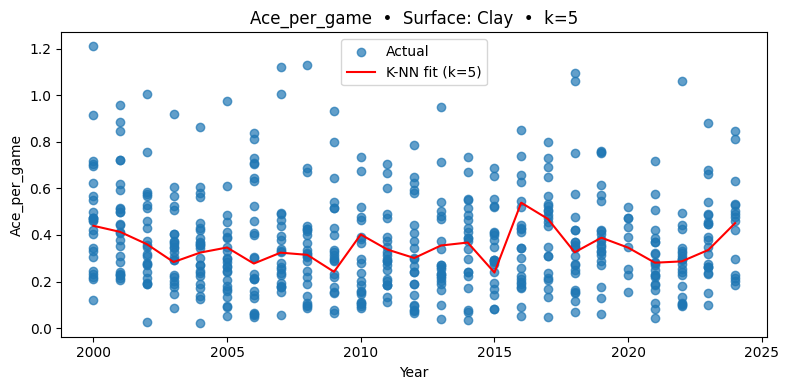

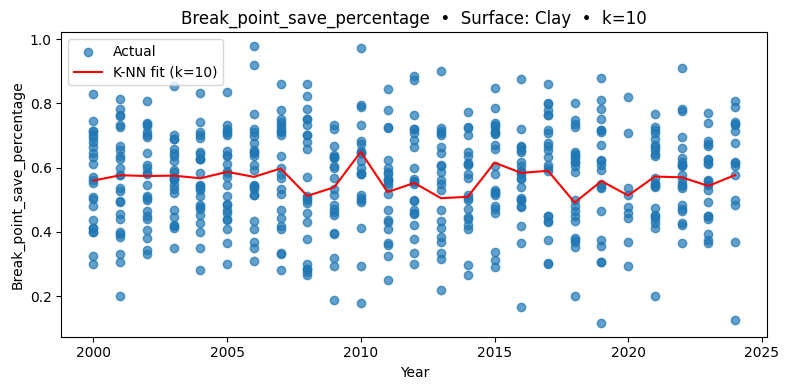

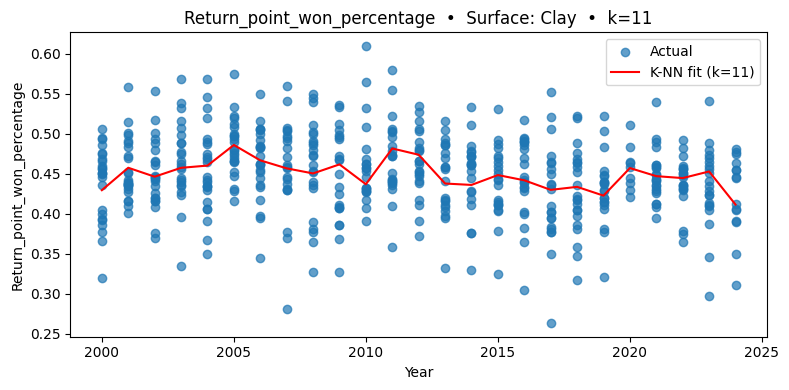

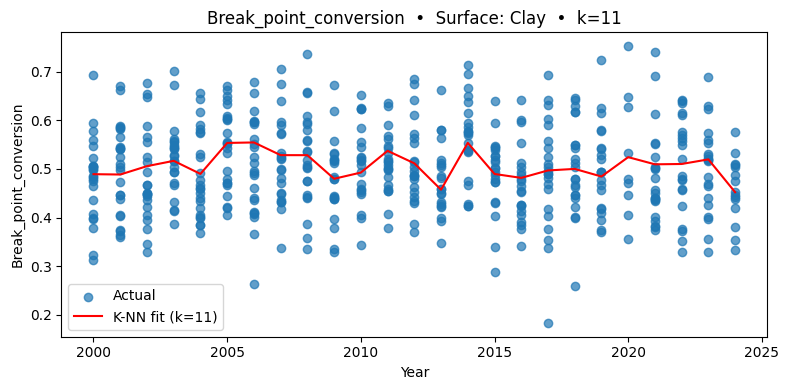

...

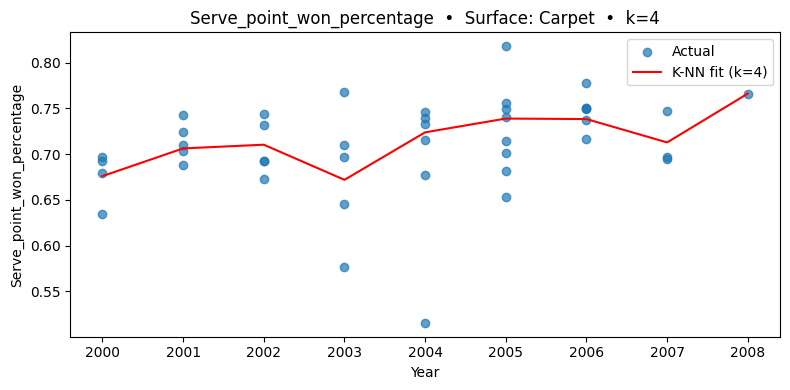

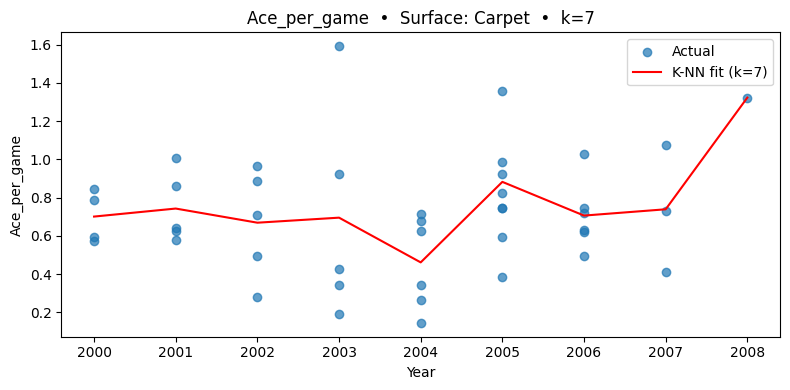

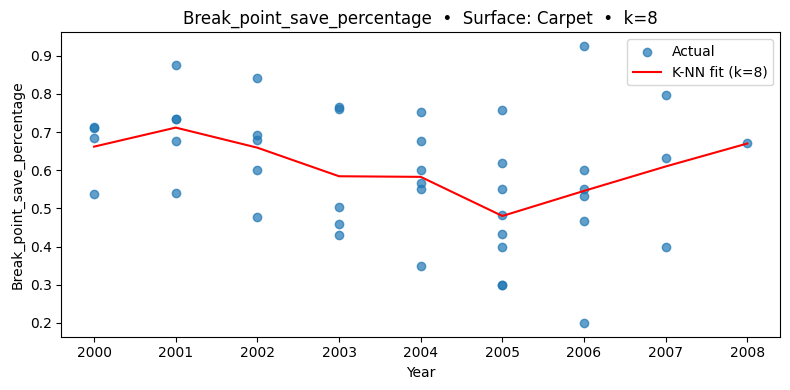

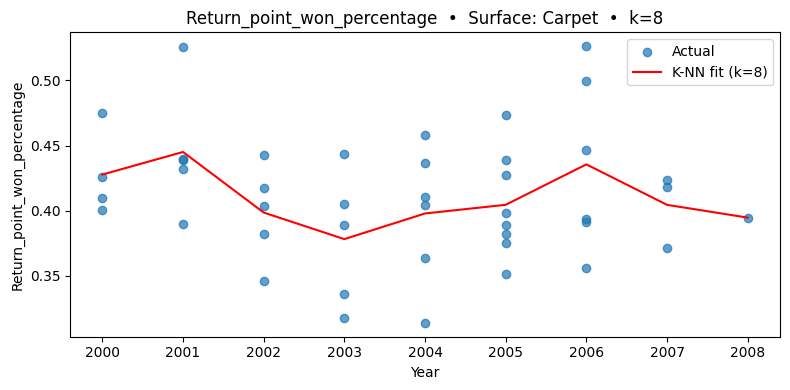

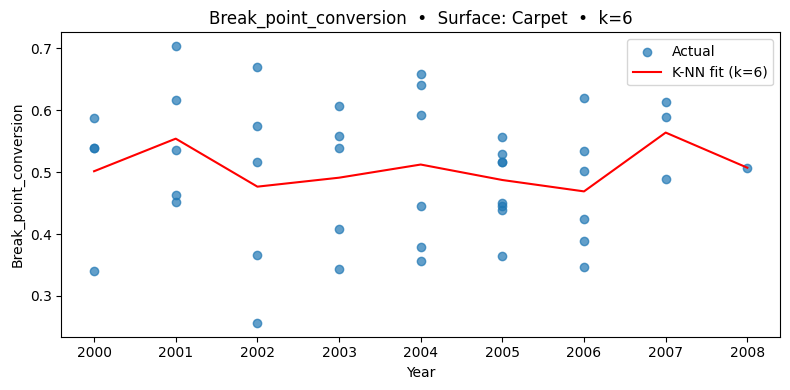

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor

# ---------- CONFIG ----------
CSV_PATH  = "updatedData.csv"
YEAR_COL, SURFACE_COL = "Year", "surface"
SURFACES  = ["Clay", "Hard", "Grass", "Carpet"]
METRICS   = [
    "Serve_point_won_percentage", "Ace_per_game",
    "Break_point_save_percentage", "Return_point_won_percentage",
    "Break_point_conversion",
]
N_SPLITS      = 5          # TimeSeriesSplit folds
PLOT_FITS     = True       # grafikleri görmek istemiyorsan False yap
GLOBAL_K_MAX  = 12         # en fazla denenmesini istediğin k
# ----------------------------

df = pd.read_csv(CSV_PATH)
results, final_models = [], {}

# -------- LOOP over surfaces & metrics --------
for surf in SURFACES:
    dfs = df[df[SURFACE_COL] == surf]
    if dfs.empty:
        print(f"[!] No data for surface: {surf}")
        continue

    for metric in METRICS:
        X = dfs[[YEAR_COL]]
        y = dfs[metric].values

        # --- 1. En küçük train set boyutunu bul ---
        tscv = list(TimeSeriesSplit(n_splits=N_SPLITS).split(X))
        min_train_size = min(len(tr) for tr, _ in tscv)

        # k adaylarını k <= min_train_size olacak şekilde kısıtla
        candidate_ks = [k for k in range(1, GLOBAL_K_MAX + 1) if k <= min_train_size]
        if not candidate_ks:
            print(f"[!] Too few samples for {surf} – {metric}; skipped.")
            continue

        # --- 2. En iyi k'yi (MSE) ara ---
        mse_per_k = []
        for k in candidate_ks:
            fold_mse = []
            for tr, te in tscv:
                mdl = KNeighborsRegressor(n_neighbors=k, weights="distance", p=2)
                mdl.fit(X.iloc[tr], y[tr])
                fold_mse.append(mean_squared_error(y[te], mdl.predict(X.iloc[te])))
            mse_per_k.append(np.mean(fold_mse))

        best_k = candidate_ks[int(np.argmin(mse_per_k))]

        # --- 3. Best-k ile modeli değerlendir ---
        mae = mse = rmse = r2 = []
        for tr, te in tscv:
            mdl = KNeighborsRegressor(n_neighbors=best_k, weights="distance", p=2)
            mdl.fit(X.iloc[tr], y[tr])
            yp = mdl.predict(X.iloc[te])
            mae.append(mean_absolute_error(y[te], yp))
            mse.append(mean_squared_error(y[te], yp))
            rmse.append(np.sqrt(mse[-1]))
            r2.append(r2_score(y[te], yp))

        results.append({
            "Surface": surf,
            "Metric" : metric,
            "Best_k" : best_k,
            "MAE"    : np.mean(mae),
            "MSE"    : np.mean(mse),
            "RMSE"   : np.mean(rmse),
            "R²"     : np.mean(r2),
        })

        key = f"{surf}__{metric}"
        final_models[key] = (
            KNeighborsRegressor(n_neighbors=best_k, weights="distance", p=2).fit(X, y),
            X, y, best_k
        )

# -------- 4. Sonuç tablosu --------
results_df = pd.DataFrame(results).round(3)
print("\nCross-validated KNN scores by surface & metric (best k chosen):")
print(results_df.to_string(index=False))

# -------- 5. Opsiyonel grafikler --------
if PLOT_FITS:
    for key, (model, X, y, best_k) in final_models.items():
        surface, metric = key.split("__")
        grid = pd.DataFrame({YEAR_COL: range(X[YEAR_COL].min(), X[YEAR_COL].max() + 1)})
        y_pred = model.predict(grid)

        plt.figure(figsize=(8, 4))
        plt.scatter(X[YEAR_COL], y, alpha=0.7, label="Actual")
        plt.plot(grid[YEAR_COL], y_pred, "r", label=f"K-NN fit (k={best_k})")
        plt.title(f"{metric}  •  Surface: {surface}  •  k={best_k}")
        plt.xlabel("Year"); plt.ylabel(metric)
        plt.legend(); plt.tight_layout(); plt.show()


This code is for tournament levels.


Cross-validated KNN scores by tournament level & metric (best k chosen):
Level                      Metric  Best_k    MAE    MSE   RMSE     R²
    A  Serve_point_won_percentage      12 -0.004 -0.004 -0.004 -0.004
    A                Ace_per_game      12  0.169  0.169  0.169  0.169
    A Break_point_save_percentage      12  0.066  0.066  0.066  0.066
    A Return_point_won_percentage      12  0.010  0.010  0.010  0.010
    A      Break_point_conversion       7  0.043  0.043  0.043  0.043
    M  Serve_point_won_percentage      10  0.026  0.026  0.026  0.026
    M                Ace_per_game      10  0.140  0.140  0.140  0.140
    M Break_point_save_percentage      12  0.066  0.066  0.066  0.066
    M Return_point_won_percentage      12 -0.048 -0.048 -0.048 -0.048
    M      Break_point_conversion      12 -0.044 -0.044 -0.044 -0.044
    G  Serve_point_won_percentage      10  0.001  0.001  0.001  0.001
    G                Ace_per_game      10  0.080  0.080  0.080  0.080
    G Break_poin

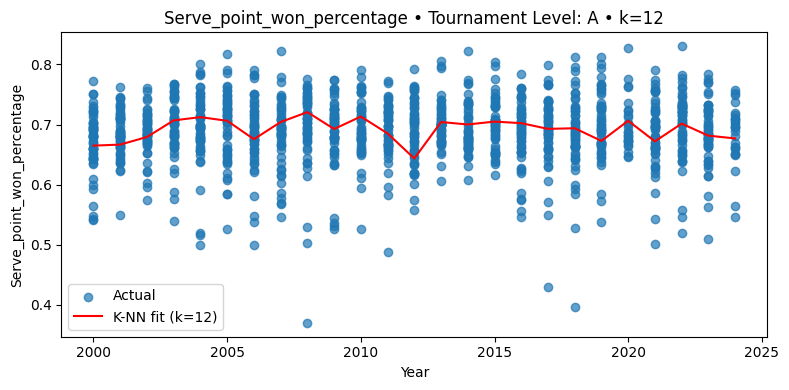

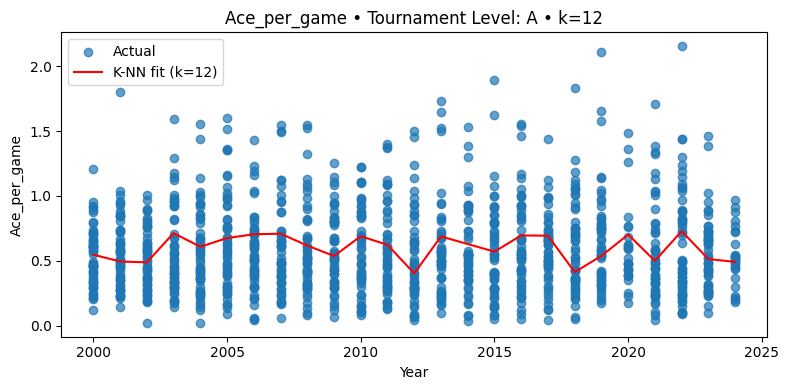

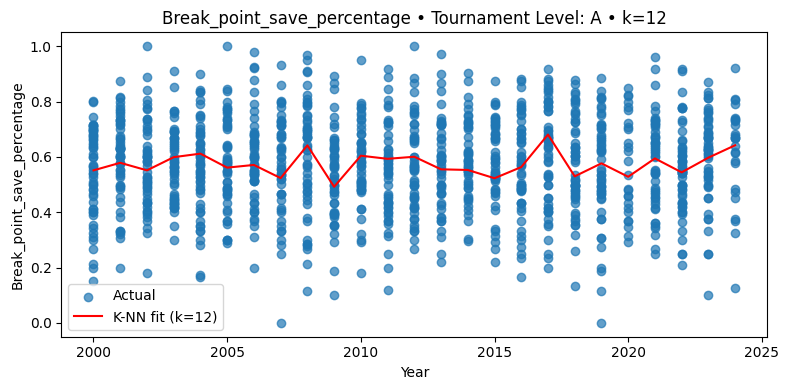

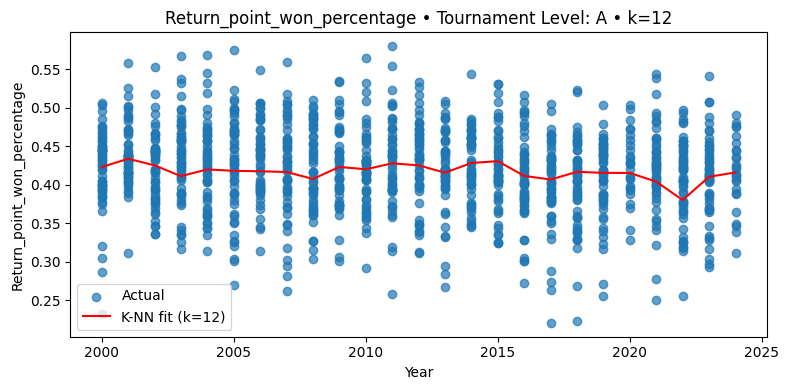

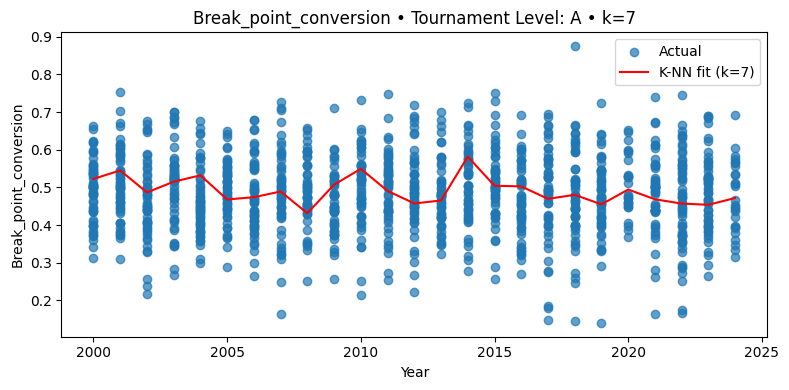

...

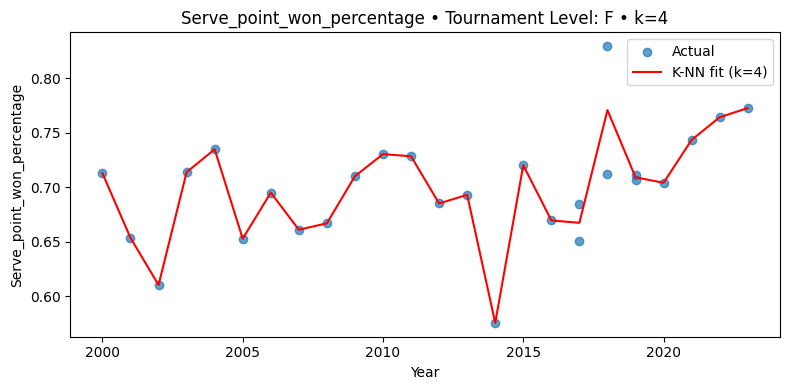

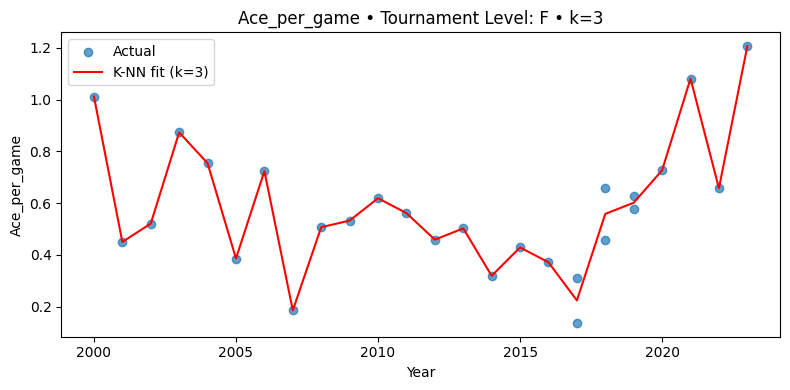

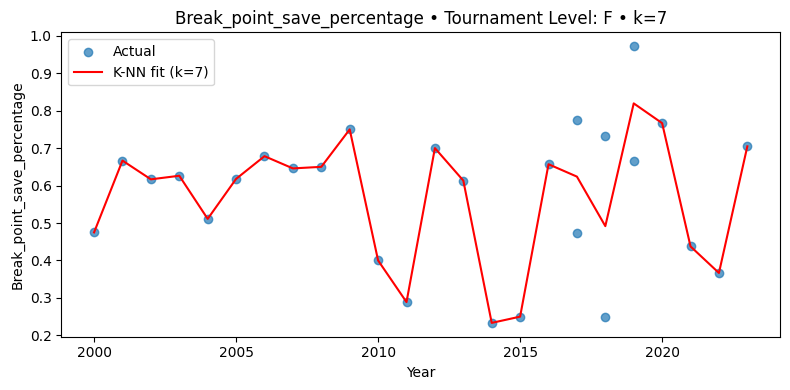

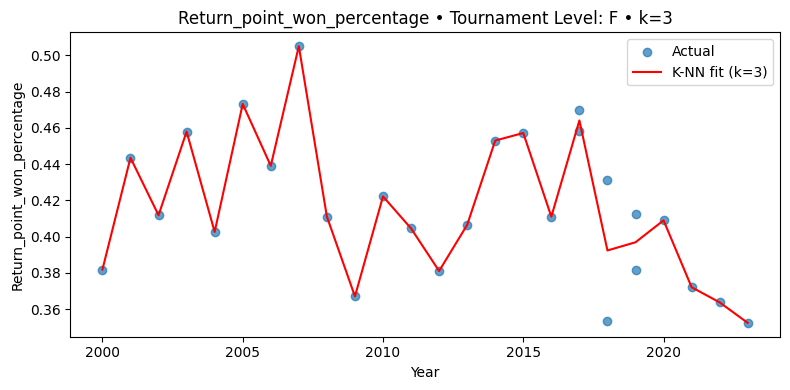

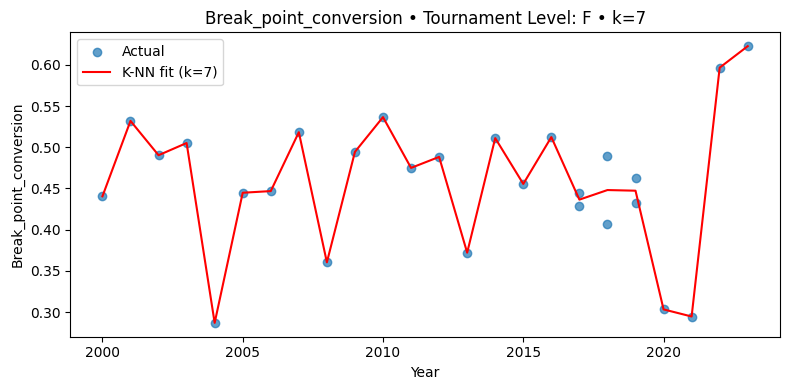

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor

# ---------- CONFIG ----------
CSV_PATH  = "updatedData.csv"
YEAR_COL, LEVEL_COL = "Year", "tourney_level"
LEVELS = ["A", "M", "G", "F"]          # ATP 250-500-1000-Finals benzeri
METRICS = [
    "Serve_point_won_percentage", "Ace_per_game",
    "Break_point_save_percentage", "Return_point_won_percentage",
    "Break_point_conversion",
]
N_SPLITS     = 5       # TimeSeriesSplit kat sayısı
PLOT_FITS    = True    # grafik çizilsin mi?
GLOBAL_K_MAX = 12      # denenmesini istediğin en büyük k
# ----------------------------

df = pd.read_csv(CSV_PATH)
results, final_models = [], {}

# ----- 1. CV döngüsü: seviye & metrik -----
for lvl in LEVELS:
    dfl = df[df[LEVEL_COL] == lvl]
    if dfl.empty:
        print(f"[!] No data for level: {lvl}")
        continue

    for metric in METRICS:
        X = dfl[[YEAR_COL]]
        y = dfl[metric].values

        # --- 1a. En küçük train set boyutunu bul (fold-bazında) ---
        tscv = list(TimeSeriesSplit(n_splits=N_SPLITS).split(X))
        min_train = min(len(tr) for tr, _ in tscv)

        # --- 1b. k adaylarını filtrele: k <= min_train ---
        ks = [k for k in range(1, GLOBAL_K_MAX + 1) if k <= min_train]
        if not ks:
            print(f"[!] Too few samples for {lvl} – {metric}; skipped.")
            continue

        # --- 1c. En iyi k'yi (ortalama MSE) ara ---
        mse_per_k = []
        for k in ks:
            fold_mse = []
            for tr, te in tscv:
                mdl = KNeighborsRegressor(n_neighbors=k, weights="distance", p=2)
                mdl.fit(X.iloc[tr], y[tr])
                fold_mse.append(mean_squared_error(y[te], mdl.predict(X.iloc[te])))
            mse_per_k.append(np.mean(fold_mse))

        best_k = ks[int(np.argmin(mse_per_k))]

        # --- 1d. Best-k ile kesin değerlendirme ---
        mae = mse = rmse = r2 = []
        for tr, te in tscv:
            mdl = KNeighborsRegressor(n_neighbors=best_k, weights="distance", p=2)
            mdl.fit(X.iloc[tr], y[tr])
            yp = mdl.predict(X.iloc[te])
            mae.append(mean_absolute_error(y[te], yp))
            mse.append(mean_squared_error(y[te], yp))
            rmse.append(np.sqrt(mse[-1]))
            r2.append(r2_score(y[te], yp))

        results.append({
            "Level" : lvl,
            "Metric": metric,
            "Best_k": best_k,
            "MAE"   : np.mean(mae),
            "MSE"   : np.mean(mse),
            "RMSE"  : np.mean(rmse),
            "R²"    : np.mean(r2),
        })

        key = f"{lvl}__{metric}"
        final_models[key] = (
            KNeighborsRegressor(n_neighbors=best_k, weights="distance", p=2).fit(X, y),
            X, y, best_k
        )

# ----- 2. Sonuç tablosu -----
results_df = pd.DataFrame(results).round(3)
print("\nCross-validated KNN scores by tournament level & metric (best k chosen):")
print(results_df.to_string(index=False))

# ----- 3. Opsiyonel çizimler -----
if PLOT_FITS:
    for key, (model, X, y, k) in final_models.items():
        lvl, metric = key.split("__")
        grid = pd.DataFrame({YEAR_COL: range(X[YEAR_COL].min(), X[YEAR_COL].max() + 1)})
        y_pred = model.predict(grid)

        plt.figure(figsize=(8, 4))
        plt.scatter(X[YEAR_COL], y, alpha=0.7, label="Actual")
        plt.plot(grid[YEAR_COL], y_pred, "r", label=f"K-NN fit (k={k})")
        plt.title(f"{metric} • Tournament Level: {lvl} • k={k}")
        plt.xlabel("Year"); plt.ylabel(metric)
        plt.legend(); plt.tight_layout(); plt.show()


### Regression Model Comparison and Results

I have used **three regression models**:  
- **Linear Regression**  
- **Decision Tree Regression** using **XGBoost**  
- **K-Nearest Neighbors (KNN) Regression**

Based on the **mean squared error (MSE)** and **root mean squared error (RMSE)** across different scopes of the dataset, the results are summarized below:

#### ✅ General (All Data Combined)
- **Linear Regression** achieved the **lowest MSE for all 5 metrics**, resulting in a **100% win rate**.
- XGBoost and KNN did not outperform linear regression in any of the overall metrics.

#### ✅ By Surface (Clay, Hard, Grass, Carpet)
- Across **20 surface-metric combinations**, **Linear Regression** was again the best in **100%** of the cases.
- XGBoost came close in a few (e.g., Ace per Game on Clay), but never surpassed the performance of linear regression.
- KNN consistently underperformed and was unstable on some surfaces (e.g., Carpet – Return Point Won %).

#### ✅ By Tournament Level (A, M, G, F)
- In all **20 level-metric combinations**, **Linear Regression** provided the best results.
- Even in noisy subsets like **F-level**, where all models struggled, linear regression produced the **lowest errors**.

#### 📊 Overall Win Rate by Model

| Model            | General | Surface | Level | Total Wins | Win Rate |
|------------------|---------|---------|-------|-------------|----------|
| Linear Regression | 5/5     | 20/20   | 20/20 | **45 / 45** | **100%** |
| XGBoost (DT)      | 0/5     | 0/20    | 0/20  | 0 / 45      | 0%       |
| KNN Regression    | 0/5     | 0/20    | 0/20  | 0 / 45      | 0%       |

#### 📌 Conclusion:
Even Decision Tree and KNN are more complex model Linear Regression fits better to my purpose because it gives less error and it is much more easy to explain and use, so for this project simple Linear Regression method is the best one according to my results.


Due to my result I will try to predict year 2025 metrics with Linear Regression with data from every surface and every tournament level through the years.

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# -------------------------
# CONFIG
# -------------------------
CSV_PATH = "updatedData.csv"
YEAR_COL = "Year"
METRICS = [
    "Serve_point_won_percentage",
    "Ace_per_game",
    "Break_point_save_percentage",
    "Return_point_won_percentage",
    "Break_point_conversion",
]
PREDICT_YEARS = [2023, 2024, 2025]
# -------------------------

# Load the data
df = pd.read_csv(CSV_PATH)

# Prepare the data for training
X_train = df[[YEAR_COL]]
y_train_data = df[METRICS] # Select all metric columns

# Prepare the input for prediction
X_predict = pd.DataFrame({YEAR_COL: PREDICT_YEARS})

# Dictionary to store predictions for each metric for each year
predictions = {}

# Loop through each metric and make predictions for all specified years
for metric in METRICS:
    y_train = y_train_data[metric] # Select the target variable for the current metric

    # Train a Linear Regression model on the entire dataset for this metric
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Make the predictions for the target years
    y_preds = model.predict(X_predict)

    # Store the predictions for the current metric
    predictions[metric] = y_preds

# Print the predictions for each year
for year in PREDICT_YEARS:
    print(f"\n--- Results for year {year} ---")

    # Check if real data exists for this year
    df_year = df[df[YEAR_COL] == year]
    if not df_year.empty:
        print("Real Data Mean:")
        for metric in METRICS:
            real_mean = df_year[metric].mean()
            print(f"- {metric}: {real_mean:.3f}")

    print("Predicted Data:")
    for metric in METRICS:
        # Find the prediction for the current year and metric
        year_index = PREDICT_YEARS.index(year)
        prediction_value = predictions[metric][year_index]
        print(f"- {metric}: {prediction_value:.3f}")


--- Results for year 2023 ---
Real Data Mean:
- Serve_point_won_percentage: 0.684
- Ace_per_game: 0.561
- Break_point_save_percentage: 0.593
- Return_point_won_percentage: 0.410
- Break_point_conversion: 0.489
Predicted Data:
- Serve_point_won_percentage: 0.695
- Ace_per_game: 0.576
- Break_point_save_percentage: 0.574
- Return_point_won_percentage: 0.411
- Break_point_conversion: 0.479

--- Results for year 2024 ---
Real Data Mean:
- Serve_point_won_percentage: 0.691
- Ace_per_game: 0.531
- Break_point_save_percentage: 0.612
- Return_point_won_percentage: 0.418
- Break_point_conversion: 0.470
Predicted Data:
- Serve_point_won_percentage: 0.695
- Ace_per_game: 0.577
- Break_point_save_percentage: 0.574
- Return_point_won_percentage: 0.410
- Break_point_conversion: 0.478

--- Results for year 2025 ---
Predicted Data:
- Serve_point_won_percentage: 0.696
- Ace_per_game: 0.577
- Break_point_save_percentage: 0.574
- Return_point_won_percentage: 0.409
- Break_point_conversion: 0.478


From prediction and real data differences of 2023 and 2024 I can assume that there is not much error rate for Linear Regression, so I can use this Supervised Machine Learning method to predict next years like 2025 which can be seen in output of the code.